# importing packages

In [118]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import os
import matplotlib.patches as mpatches

In [119]:
#make folder path for data
def makeFolderPathForData(parent_dir, folderName_header, folderName_common, folderName_suffix):
    #makes a new directory for your files
    #returns the folder name for use in other functions
    folderName = folderName_header + folderName_common + folderName_suffix
    path = os.path.join(parent_dir,folderName)
    if not os.path.exists(path):
        os.mkdir(path)
    return folderName

#to excel function
def outputToExcel(df_data, fileName_header, fileName_Common, fileName_suffix,
                  parent_dir, folderName, sheetName):
    fileName = fileName_header + fileName_Common + fileName_suffix
    outfile_extension = '.xlsx'
    outfile_boxplts = fileName + outfile_extension
    path_out= os.path.join(parent_dir, folderName, outfile_boxplts)

    if os.path.exists(path_out):
            #if old sheet
            with pd.ExcelWriter(path_out, mode = 'a', if_sheet_exists = 'overlay') as writer:
                    df_data.to_excel(writer, sheet_name = sheetName, index = True)
    else: 
            #new sheet
            with pd.ExcelWriter(path_out) as writer:
                    df_data.to_excel(writer, sheet_name = sheetName, index = True) #if new sheet

def outputFiguresPath(fileName_header, fileName_mid, fileName_suff, parent_dir, folderName):
        fileName_header = str(fileName_header)
        fileName_mid = str(fileName_mid)
        fileName_suff = str(fileName_suff)

        #cleaning the input to prevent addition of / to the directory
        fileName_header = fileName_header.replace("/", "-")
        fileName_mid = fileName_mid.replace("/", "-")
        fileName_suff = fileName_suff.replace("/", "-")

        fileName = fileName_header + fileName_mid +fileName_suff
        out_filename = fileName + '.tif'
        new_filepath = os.path.join(parent_dir, folderName, out_filename)
        #the output path can be used to save the figure
        return new_filepath
        # plt.savefig(new_filepath, bbox_inches = 'tight')

# File naming and path creation

In [120]:
#updates to directory management
machine_directory = 'C:/Users/mcremer' #the C and path to the project folder
# machine_directory = 'C:/Users/maega' #when working from home machine
storage_directory = 'UFL Dropbox/Maegan Cremer/research-share/Maegan/Projects' #Local, HPG, or dropbox
project_directory = 'Cardiac-Amyloidosis-Multiple-Myeloma' #project folder
project_lv2_directory = '014_Mistic2' #deeper part of project folder

path = os.path.join(machine_directory, storage_directory, 
                    project_directory, project_lv2_directory)

parent_dir = path

In [121]:
folderNameHeader = "FeatComp"
folderNameCommon = '_RBF'
folderNameSuffix = "_241119_v1"

fileNameHeader = "FeatComp"
fileNameCommon = '_RBF'
fileNameSuffix = "_241119_v1"

folder_data_out = makeFolderPathForData(parent_dir=parent_dir, folderName_header=folderNameHeader,
                                        folderName_common=folderNameCommon, folderName_suffix=folderNameSuffix)
# outputToExcel(*, fileName_header=fileNameHeader, fileName_Common= fileNameCommon, 
#               fileName_suffix= fileNameSuffix, folderName = folder_data_out, sheetName= *)

# fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid=**, 
#                                  fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

In [122]:
#setting figure resolution: 
mpl.rcParams['figure.dpi'] = 300

# directory for getting the original feature list

In [123]:
project_lv2_directory = '014_Mistic2/010_analysis of data completeness/ALKnown_DataComplet-Frq_exG01J01_2024-10-17_v1' #deeper part of project folder

# "C:\Users\mcremer\UFL Dropbox\Maegan Cremer\research-share\Maegan\Projects\Cardiac-Amyloidosis-Multiple-Myeloma\012 Processed Data\AL_Known_DataComplet-Freq_allLabs_2024-08-02_v1"

path = os.path.join(machine_directory, storage_directory, project_directory, project_lv2_directory)

new_dirrectory = path
os.chdir(new_dirrectory)

In [124]:
LabList = ["Ferritin Result(ng/mL)","Troponin-T","NT Pro BNP (B-Type Natriuretic Peptide)","Beta-2-Microglobulin Result",
                "ALT Result(U/L)","LDH Result(U/L)","Creatinine Result(mg/dL)","Potassium Result(mmol/L)","Glucose Result",
                "total CO2 Result","Sodium Result(mmol/L)","Calcium Result(mg/dL)","Chloride Result(mmol/L)","BUN Result(mg/dL)",
                "Platelet Count Result(k/uL)","Hemoglobin Result","MCV Result","MCHC Result","MCH Result(pg)","HCT Result",
                'RBC Result','WBC Result(k/uL)','Albumin Result(gm/dL)','Pct. Mono Result','Pct. Neutrophil Result',
                'Neutrophil Result','Monocyte Result','Nucleated RBC Result','Pct. Immature Gran Auto Result','AST Result(U/L)',
                'Total Serum Protein Result','Kappa Free Light Chains Result (mg/L)','Serum Electrophoresis Gamma Result','Albumin Electrophoresis Result',
                'Serum Electrophoresis Alpha 1 Result','Serum Electrophoresis Alpha 2 Result','Serum Electrophoresis Beta Result']


### importing the data

In [125]:
#import the original feature list
lab_list_import = pd.read_excel("ALKnown_DataComplet-Frq_exG01J01_2024-10-17_v1.xlsx", sheet_name = "labs completeness", header = [0])
# "C:\Users\mcremer\UFL Dropbox\Maegan Cremer\research-share\Maegan\Projects\Cardiac-Amyloidosis-Multiple-Myeloma\012 Processed Data\AL_Known_DataComplet-Freq_allLabs_2024-08-02_v1\AL_Known_DataComplet-Freq_allLabs_2024-08-02_v1.xlsx"

#for the number of lab instances per lab per patient
df_NumbLabsPerLabPerPt =  pd.read_excel("ALKnown_DataComplet-Frq_exG01J01_2024-10-17_v1.xlsx", sheet_name = "numb labs per lab per pt", header = [0])

df_demographics = pd.read_excel("ALKnown_DataComplet-Frq_exG01J01_2024-10-17_v1.xlsx", sheet_name = "encoded demographics", header = [0])

In [126]:
#list positive and negative amyloid status
listPositive = [pt for pt in df_demographics.index if df_demographics.at[pt, "Amyloid Status"] == 2]
listNegative = [pt for pt in df_demographics.index if df_demographics.at[pt, "Amyloid Status"] == 1]

### collecting the lab names and the number of patients as seperate series

In [127]:
lab_list = lab_list_import.iloc[:,0] #list of the raw lab result names without transformations
lab_list_import.index = lab_list_import.iloc[:,0]
lab_list_dict = lab_list_import.T.to_dict() #nested dictionary where there is a row "Number of Patients with this lab"
lab_list_numbpts = lab_list_import.iloc[:,2] #for use later in assessing the completeness of the data

In [128]:
df_lab_list_numb_pts = lab_list_import.iloc[:,[2]]
df_lab_list_numb_pts.index = lab_list_import.iloc[:,[0]]

### additional features describing patients which arean't labs in their untransformed states
no descriptive statistics or fits

In [129]:
#additional starting features
additional_features = pd.Series(["Amyloid Status_yes", "Dx_MGUS", "Dx_MM", "Dx_other", "Sex_female", "Sex_male", 'Age', 'Survival (in months)',
                       "ChemoTx", "ImmunoTx", "HemeTx", 
                       "RadTx", "OtherTx", 'time from diagnosis to note (months)', 
                       'ECOG Performance Status', 'Karnofsky Performance Status'])
#here the "ChemoTx Number" and similar original data were removed as they will be picked up as transformations

In [130]:
full_og_featureList = pd.concat([lab_list, additional_features], axis = 0) #adding the two lists of features together
full_og_featureList.reset_index()

,index,0
0,0,ALT Result(U/L)
1,1,Potassium Result(mmol/L)
2,2,Monocyte Result
3,3,NT Pro BNP (B-Type Natriuretic Peptide)
4,4,Neutrophil Result
...,...,...
71,11,RadTx
72,12,OtherTx
73,13,time from diagnosis to note (months)
74,14,ECOG Performance Status


# get the list of best features from the SVM models 

In [131]:
project_lv2_directory = '014_Mistic2' #deeper part of project folder

path = os.path.join(machine_directory, storage_directory, 
                    project_directory, project_lv2_directory)

new_dirrectory = path
os.chdir(new_dirrectory)

### importing the list of best features by model and finding the unique list of features + transformations

In [132]:
#the best performing models with the RBF kernel
features_models_for_poster = pd.read_excel("ComparingRBFvLinear_20241118_v1.xlsx", sheet_name = "rbf best" , header = [0])
# features_models_for_poster.drop(columns=[('model')],axis =1, inplace = True)
features_across_models= features_models_for_poster

In [133]:
# #the best performing models with the linear kernel
# features_models_for_poster = pd.read_excel("ComparingRBFvLinear_20241118_v1.xlsx", sheet_name = "linear best" , header = [0])
# # features_models_for_poster.drop(columns=[('model')],axis =1, inplace = True)
# features_across_models= features_models_for_poster

### assigning variables to fit data imported

In [134]:
# #setting equivalency so that the code updates as you move down
# features_across_models= features_across_allLabs

#create 1D list of features across all models
features_1D = features_across_models.to_numpy().flatten()

features_1D_clean = features_1D[~pd.isna(features_1D)]
#create list of unique features across all models
features_1D_unique = pd.unique(features_1D_clean)

### Describing the frequency of features across all models

In [135]:
#characterize the frequency of the transformed feature in the list of features selected by SVM
from collections import Counter
feature_counts = Counter(features_1D_clean)
feature_counts_dict = dict(feature_counts)


# Comparing the original data types to the list of features
makes a dictionary where the keys are the original data types represented among the features\
values are the best features represented across all models

In [136]:
#find the original list of labs within the transformed list
#filters the unique list of labs

dict_og_to_transformed = {}
dict_og_to_trimmed_transformed = {} #for use in multi-indexing
# dict_transformations_per_model = {}
# list_transformedFeatures = []
for og_feature in full_og_featureList:
    list_transformedFeatures = []
    list_transformations = []
    for feature_transformed in features_1D_unique:
        if og_feature in feature_transformed:
            # list_transformedFeatures.append(feature_transformed)
            #trimming slicing the original feature off and adding the transformed section to a list
            start_position_for_slice = len(og_feature) + 1 #removes the space when slicing
            name_transformation = feature_transformed[start_position_for_slice:] #slices the length of the orginal feature off the string
            #check to see if the section trimmed from the feature exactly matches the og_feature
            trimmed_head_string = feature_transformed[:len(og_feature)]
            if trimmed_head_string == og_feature: #ensures that the feature identified isn't a variation such as PCT myelocyte vs myelocyte
                if name_transformation != "eported": #a little weirdness from one of the echo measures
                    list_transformations.append(name_transformation) #adds the transformation to the list for that feature
                    list_transformedFeatures.append(feature_transformed) #adds the og+transform to the og_to_transform
    if len(list_transformedFeatures) != 0:
        dict_og_to_transformed[og_feature] = list_transformedFeatures
        dict_og_to_trimmed_transformed[og_feature] = list_transformations

In [137]:
#creating multi-indexed pattern for the table of features used in the SVM models 

#collecting the two arrays for indexing from the dictionary
level_1 = [] #keys
level_2 = [] #values, or the transformations

#to make the key list the same length as the value list such that the pairings can be made... 
for key in list(dict_og_to_trimmed_transformed.keys()):
    for transformation in list(dict_og_to_trimmed_transformed[key]):
        level_1.append(key)
        level_2.append(transformation)

level_1_2 = [level_1, level_2]
multiIndex_tuple_features = list(zip(*level_1_2))

### create binary dataframe of features per model with multiIndex

In [138]:
#set the unique features to the row index 
row_dictionary = dict_og_to_transformed

#set the columns to the headers from earlier, the models
column_index = features_across_models.columns

dict_binary = {}
#pull the features from a column and compare them to 
for column in column_index: 
    column_data_binary = []
    column_data = features_across_models[column]
    for key in list(row_dictionary.keys()):
        for feature in list(row_dictionary[key]):
            if feature in column_data.values:
                column_data_binary.extend([1])
            else:
                column_data_binary.extend([0])
    dict_binary[column] = column_data_binary       



multiIndex_features = pd.MultiIndex.from_tuples(multiIndex_tuple_features, names=["original data", "transformation"])
df_binary = pd.DataFrame.from_dict(dict_binary, orient = "columns")

df_binary.index = multiIndex_features


In [139]:
outputToExcel(df_binary,parent_dir=parent_dir, fileName_header=fileNameHeader, fileName_Common= fileNameCommon, 
              fileName_suffix= fileNameSuffix, folderName = folder_data_out, sheetName= "all models binary")

### frequency of transformation in a model 

In [140]:
#getting the list of transformations 

#create 1D list of transformations across all models
unique_transformations_1D = pd.DataFrame.from_dict(dict_og_to_trimmed_transformed.values()).to_numpy().flatten()

unique_transformations_1D_clean = unique_transformations_1D[~pd.isna(unique_transformations_1D)]
#create list of unique transformations across all models
unique_transformations_1D_unique = pd.unique(unique_transformations_1D_clean)
#sort the transformations so they are easier to comprehend 
unique_transformations_1D_unique_sorted = np.sort(unique_transformations_1D_unique)

#set up ways to store the data
dict_transform_counts_by_model = {}

#for the models
model_index = features_across_models.columns



In [141]:
for model in model_index: 
    feature_count_list = []
    #get the data for the model 
    model_features = features_across_models[model].dropna()
    for transformation in unique_transformations_1D_unique_sorted:
        count_tally = 0
        for feature in model_features:
            #check to see if the transformation is in the feature
            if transformation in feature:
                #get the ending of the feature and check for exact match
                #get the head of the feature by cutting the transformation length
                start_position_for_slice = len(feature) - len(transformation)
                end_position_for_slice = start_position_for_slice -1
                name_transformation = feature[start_position_for_slice:]
                trimmed_head_string = feature[:end_position_for_slice]
                #see if the head matches a real original data
                #if the head doesn't match, then the feature has a multipart transform
                #which will be caught later in the list (such as ResDesc mean)
                for og_feature in full_og_featureList:
                    if og_feature == trimmed_head_string:
                        count_tally= count_tally +1
        count_for_transform = count_tally
        feature_count_list.append(count_for_transform)
    dict_transform_counts_by_model[model] = feature_count_list

df_transform_counts_by_model = pd.DataFrame.from_dict(dict_transform_counts_by_model, orient = "columns")
df_transform_counts_by_model.index = unique_transformations_1D_unique_sorted

outputToExcel(df_transform_counts_by_model,parent_dir=parent_dir, fileName_header=fileNameHeader, fileName_Common= fileNameCommon, 
              fileName_suffix= fileNameSuffix, folderName = folder_data_out, sheetName= "transform counts by model")

### frequency of a transformation-original data pairing across models

In [142]:
#transformations vs orginal data counting
#set up ways to store the data
dict_transform_counts_origData = {}

#for original data types = 
original_data_types = list(dict_og_to_trimmed_transformed.keys())

for transformation in unique_transformations_1D_unique_sorted:
    orig_data_transform_pair_list = [] #number of original data-transform pairs across all models 
    #get the features which contain the transformation
    featureListwTranform = [feature for model in model_index for feature in features_across_models[model].dropna() if transformation in feature]
    #challenge with the above is the possibility of duplicates or partial matches
    featureListTransform_doubleChecked = []
    for feature in featureListwTranform:
        start_position = len(feature) - len(transformation)
        end_position = start_position -1
        trimmed_head_string = feature[:end_position]
        name_transformation = feature[start_position:]
        #checks to make sure the feature transform region is a complete match
        #by matching the head to original data
        # this catches compound transformation names
        for orig_data in original_data_types:
            if orig_data == trimmed_head_string:
                featureListTransform_doubleChecked.append(feature)
    # dict_transform_counts_origData[transformation] = featureListTransform_doubleChecked

    for orig_data in original_data_types:
        #filter the list of features with transformation to the features with original data
        #add each feature to the list
        end_position_header = len(orig_data)
        list_pairing = [feature for feature in featureListTransform_doubleChecked if orig_data == feature[:end_position_header]]
        count = len(list_pairing) #get the length of the list as a proxy for amount of data     
        orig_data_transform_pair_list.append(count) #add to the list
    dict_transform_counts_origData[transformation] = orig_data_transform_pair_list

df_transform_counts_origData = pd.DataFrame.from_dict(dict_transform_counts_origData, orient = "columns")
df_transform_counts_origData.index = original_data_types

outputToExcel(df_transform_counts_origData,parent_dir=parent_dir, fileName_header=fileNameHeader, fileName_Common= fileNameCommon, 
              fileName_suffix= fileNameSuffix, folderName = folder_data_out, sheetName= "transform-orig pairs counts")

### feature-original data pair one model at a time

In [143]:
#transformations vs orginal data counting
#set up ways to store the data
dict_eachmodel_trans_orig = {}

#for original data types = 
original_data_types = list(dict_og_to_trimmed_transformed.keys())

for model in model_index: 
    #set up ways to store the data
    dict_model_transform_origData = {}
    #get the model data
    model_data = features_across_models[model].dropna()
    for transformation in unique_transformations_1D_unique_sorted:
        orig_data_transform_pair_list = [] #number of original data-transform pairs across all models 
        #get the features which contain the transformation
        featureListwTranform = [feature for feature in model_data if transformation in feature]
        #challenge with the above is the possibility of duplicates or partial matches
        featureListTransform_doubleChecked = []
        for feature in featureListwTranform:
            start_position = len(feature) - len(transformation)
            end_position = start_position -1
            trimmed_head_string = feature[:end_position]
            name_transformation = feature[start_position:]
            #checks to make sure the feature transform region is a complete match
            #by matching the head to original data
            # this catches compound transformation names
            for orig_data in original_data_types:
                if orig_data == trimmed_head_string:
                    featureListTransform_doubleChecked.append(feature)


        for orig_data in original_data_types:
            #filter the list of features with transformation to the features with original data
            #add each feature to the list
            end_position_header = len(orig_data)
            list_pairing = [feature for feature in featureListTransform_doubleChecked if orig_data == feature[:end_position_header]]
            count = len(list_pairing) #get the length of the list as a proxy for amount of data
            orig_data_transform_pair_list.append(count) #add to the list
        dict_model_transform_origData[transformation] = orig_data_transform_pair_list
   
    df_model_transform_origData = pd.DataFrame.from_dict(dict_model_transform_origData, orient = "columns")
    df_model_transform_origData.index = original_data_types

    dict_eachmodel_trans_orig[model] = df_model_transform_origData

### visualizations of transformations across models 

In [144]:
#find the maximum value of frequency of original data 
max_value_colormap_trans_frequency = int(df_transform_counts_by_model.max().max()) 

cmap_resampled_trans_frequency = mpl.colormaps['magma_r'].resampled(max_value_colormap_trans_frequency)

#adding a color for 0 to make it easy to identify

insertColor = np.array([67/256,185/256, 240/256, 1])
newcolors_formap_extended_trans_frequency = cmap_resampled_trans_frequency(np.linspace(0,0.6,max_value_colormap_trans_frequency, endpoint = False))
newcolors_formap_extended_trans_frequency= np.insert(newcolors_formap_extended_trans_frequency, 0, insertColor, axis = 0)
cmap_wInsert_trans_frequency = mpl.colors.ListedColormap(newcolors_formap_extended_trans_frequency)

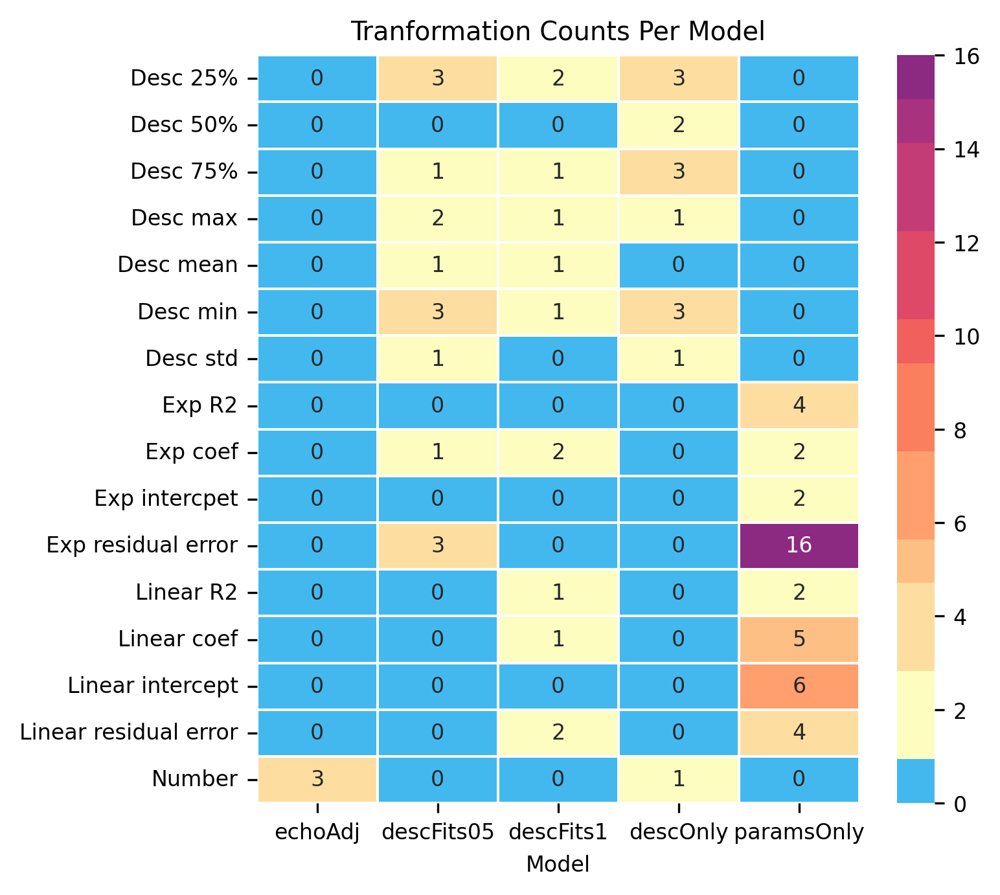

In [145]:
# df_transform_counts_by_model.plot.bar(stacked=True)
# fig, ax = plt.subplots(figsize=(10, 10))
fig, ax = plt.subplots(figsize=(5, 5))

heatmap_transformCounts_byModel = sns.heatmap(df_transform_counts_by_model.iloc[1:], cmap = cmap_wInsert_trans_frequency , ax = ax, linewidths= 0.5, annot=True)
ax.set_title("Tranformation Counts Per Model")
ax.set_xlabel("Model")
# testplot.set_xticklabels(labels =df_transform_counts_by_model.index, rotation = 90)

heatmap_transformCounts_byModel_fig = heatmap_transformCounts_byModel.get_figure()


fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_heatmap_transforms", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

heatmap_transformCounts_byModel_fig.savefig(fig_file_out, bbox_inches = 'tight')

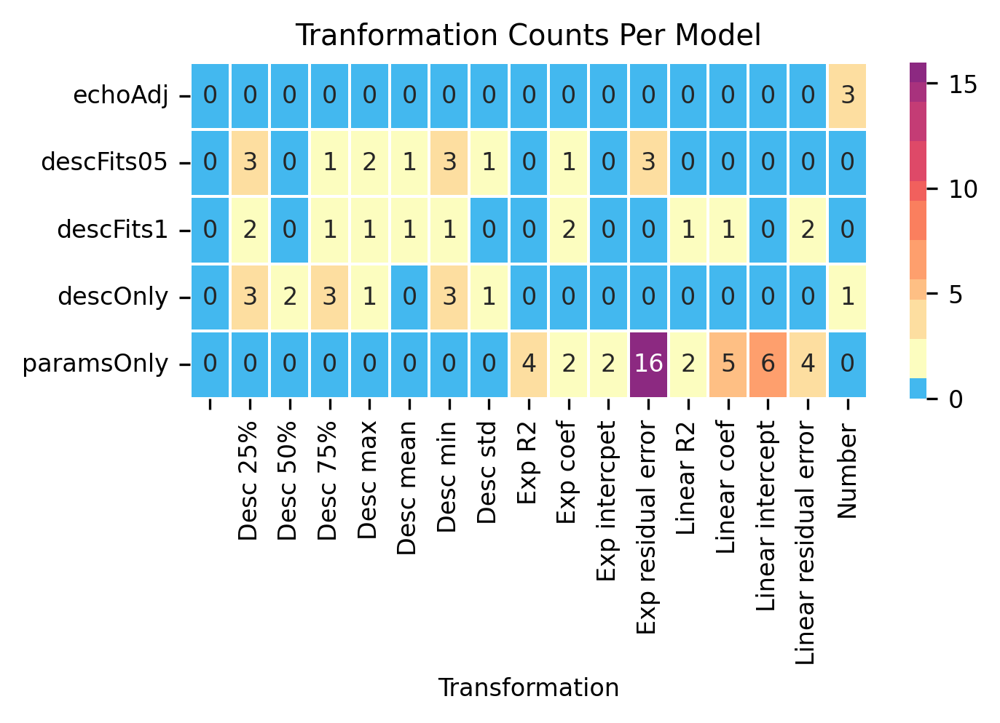

In [146]:
#alternate version of the plot rotated
fig, ax = plt.subplots(figsize=(5, 2))

data_horizontal = df_transform_counts_by_model.T

heatmap_transformCounts_byModel = sns.heatmap(data_horizontal, cmap = cmap_wInsert_trans_frequency , ax = ax, linewidths= 0.5, annot= True)
ax.set_title("Tranformation Counts Per Model")
ax.set_xlabel("Transformation")
# testplot.set_xticklabels(labels =df_transform_counts_by_model.index, rotation = 90)

heatmap_transformCounts_byModel_fig = heatmap_transformCounts_byModel.get_figure()


fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_heatmap_transforms_horiz", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

heatmap_transformCounts_byModel_fig.savefig(fig_file_out, bbox_inches = 'tight')

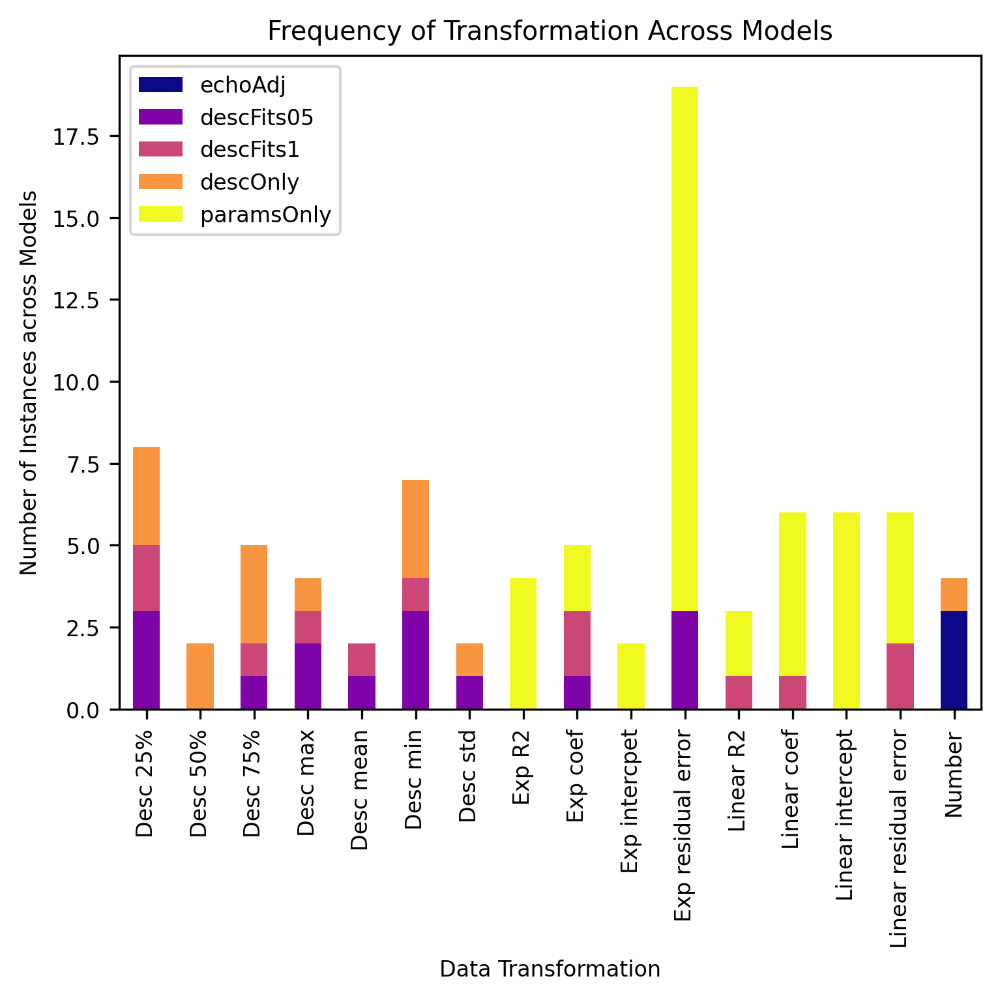

In [147]:
fig, ax = plt.subplots(figsize=(5, 5), layout = 'constrained')

stackedbar_transform_frequency = df_transform_counts_by_model.iloc[1:].plot.bar(stacked=True, cmap= "plasma", ax = ax)
ax.legend(loc = "upper left", ncol = 1)
ax.set_title("Frequency of Transformation Across Models")
ax.set_xlabel("Data Transformation")
ax.set_ylabel("Number of Instances across Models")



# stackedbar_transform_frequency_fig = stackedbar_transform_frequency.get_figure()


fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_barTransfreq", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')

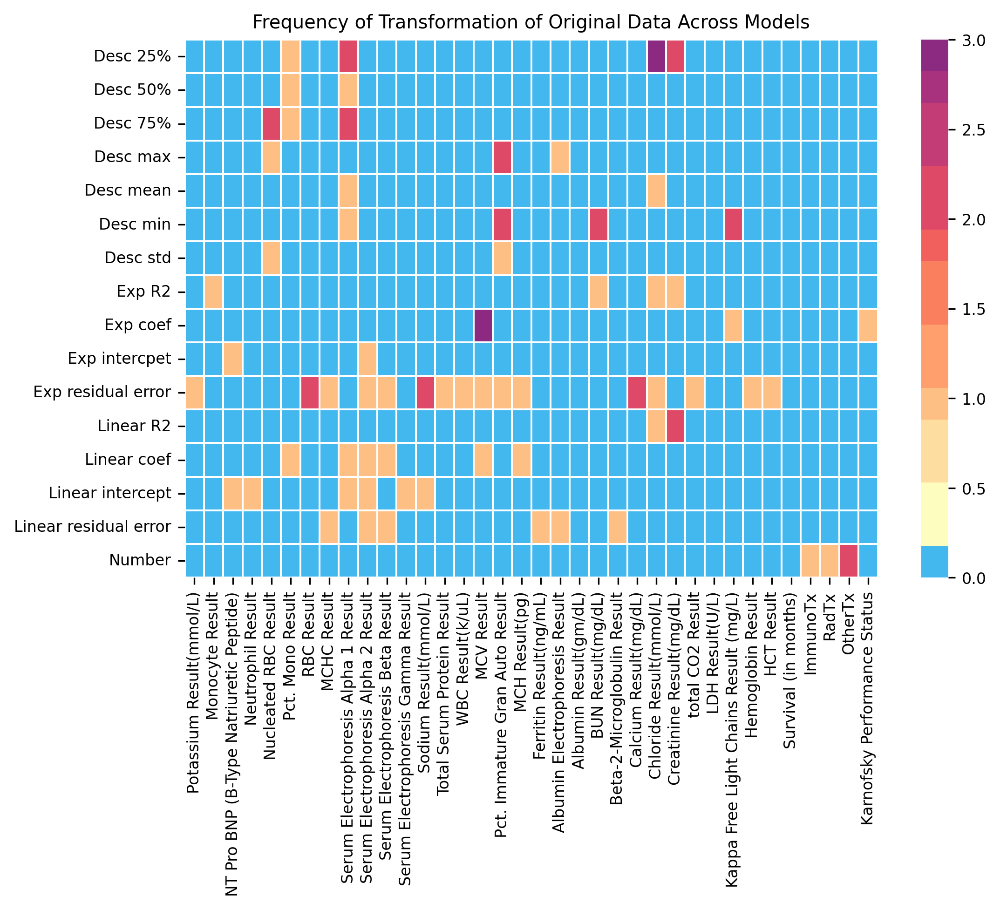

In [148]:
#visualizations
# df_transform_counts_origData.T.plot.bar(subplots= True)

fig, ax = plt.subplots(figsize=(8, 5))

heatmap_transforms_origData = sns.heatmap(df_transform_counts_origData.T.iloc[1:], cmap = cmap_wInsert_trans_frequency, linewidths= 0.5, ax = ax)
ax.set_title("Frequency of Transformation of Original Data Across Models")

heatmap_transforms_origData_fig = heatmap_transforms_origData.get_figure()


fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_heatmap_transformsVorig", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

heatmap_transforms_origData_fig.savefig(fig_file_out, bbox_inches = 'tight')

### visualization of the transform-orig data relationship per model as a heat map

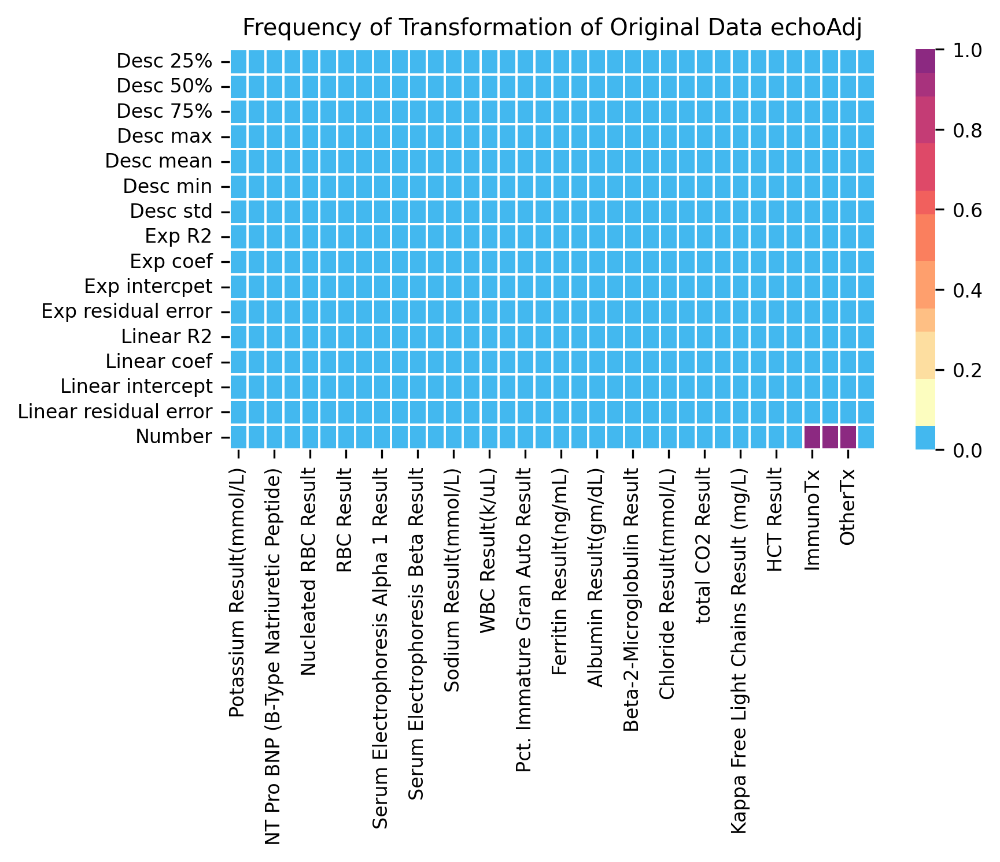

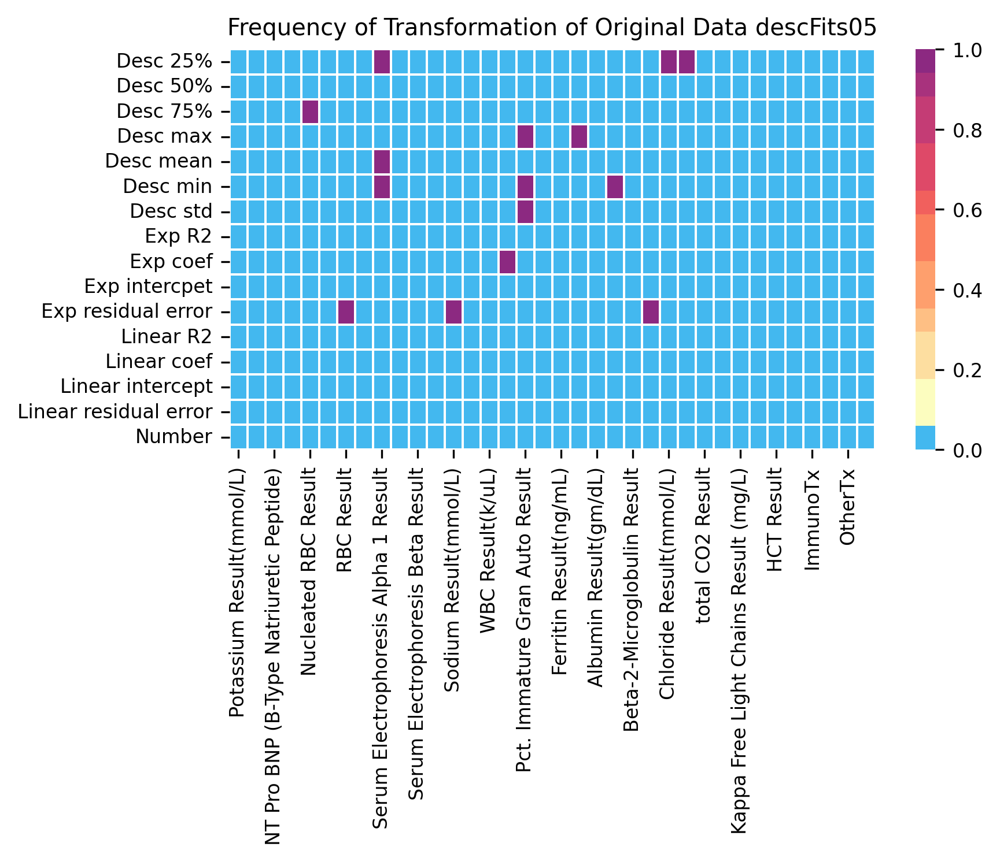

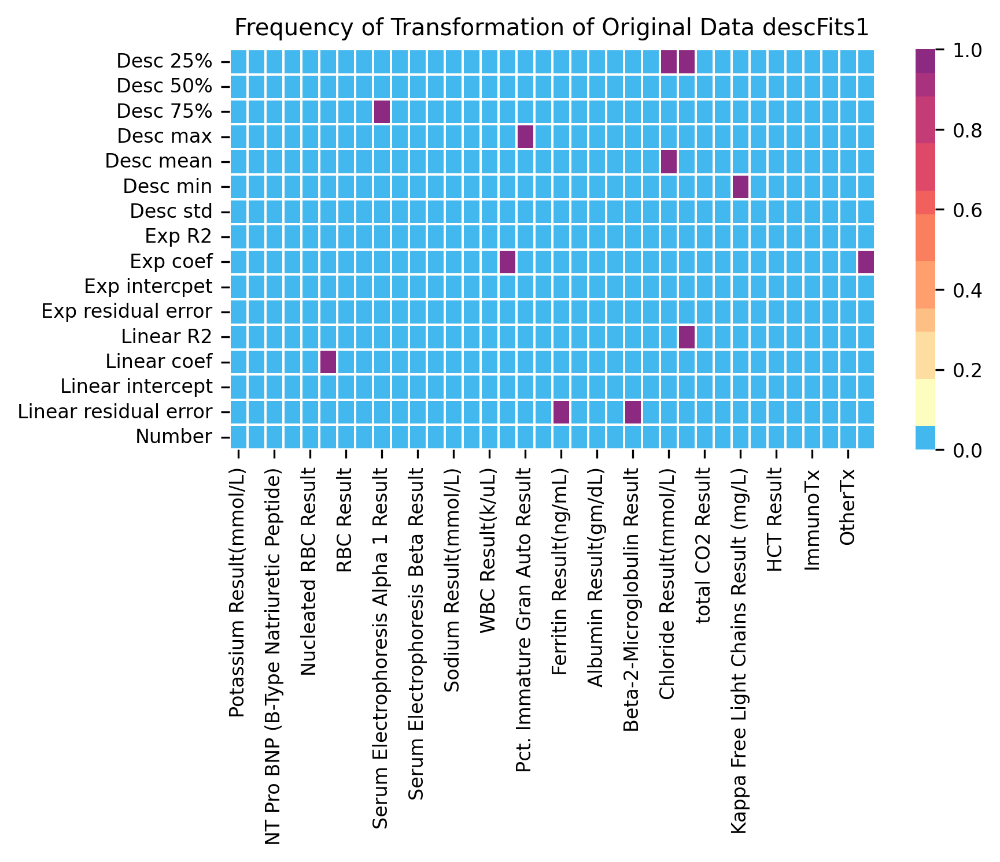

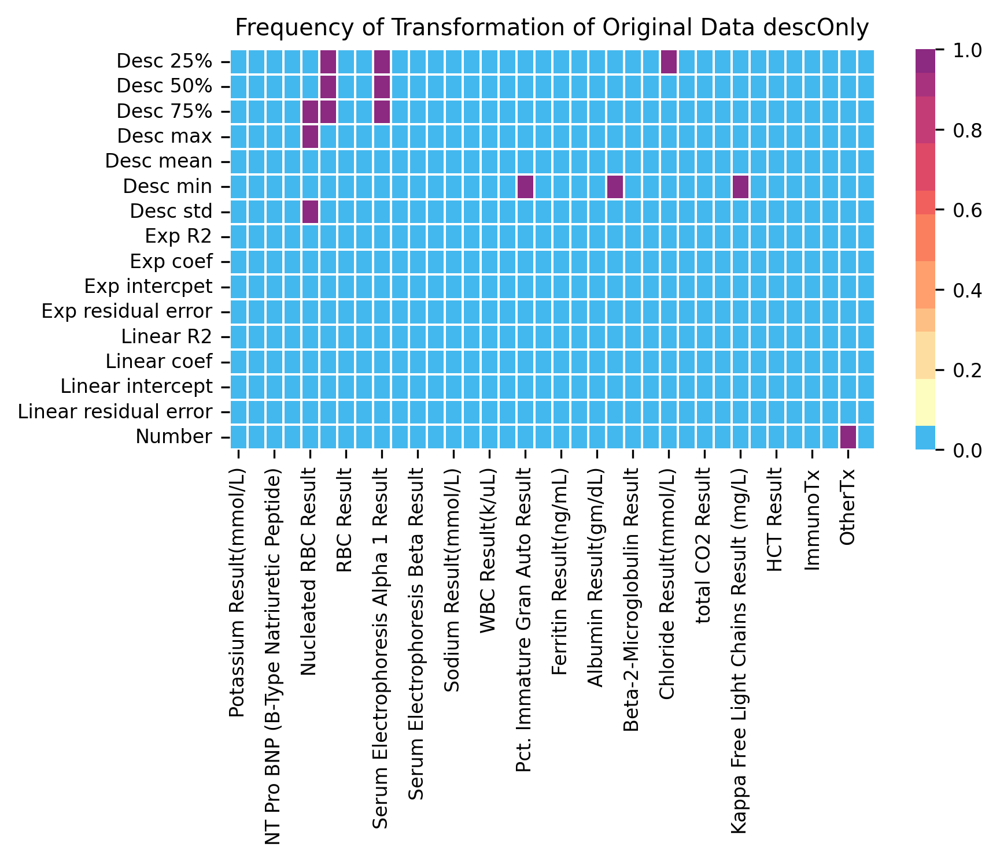

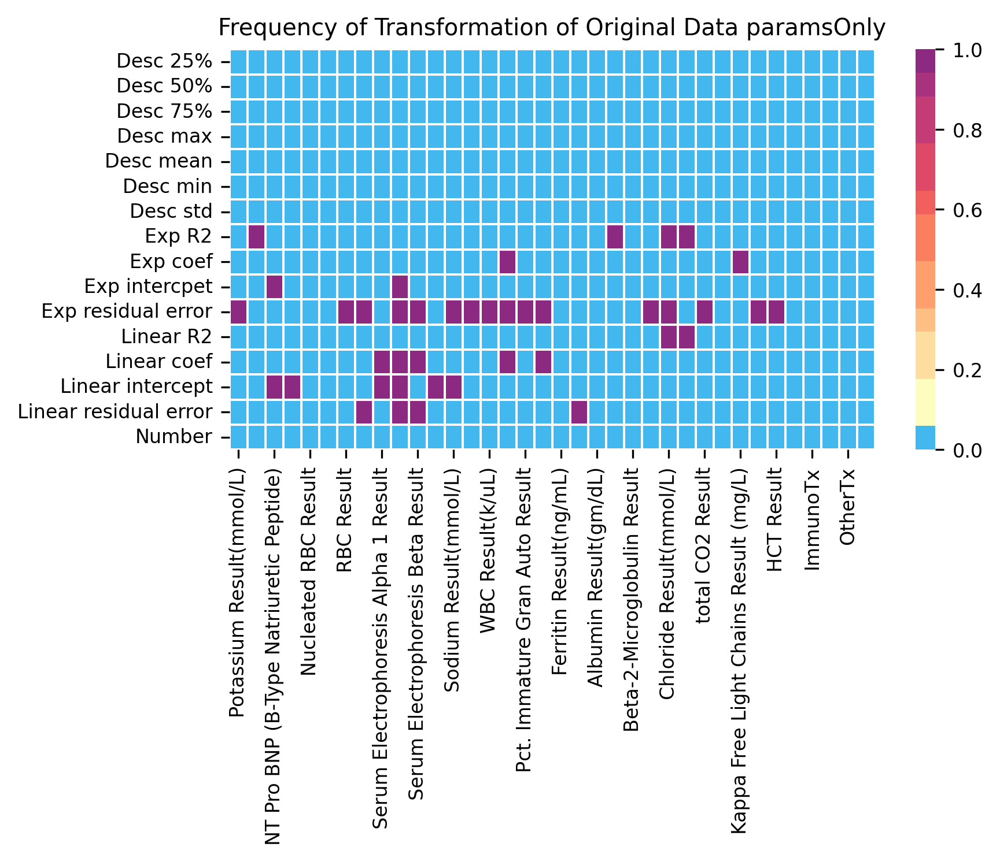

In [149]:
#visualizations
# df_transform_counts_origData.T.plot.bar(subplots= True)

fignumber = 1
for model in model_index: 
    fig, ax = plt.subplots(figsize=(6, 3))
    data_to_plot = dict_eachmodel_trans_orig[model]

    heatmap_transforms_origData = sns.heatmap(data_to_plot.T.iloc[1:], cmap = cmap_wInsert_trans_frequency, linewidths= 0.5, ax = ax)
    ax.set_title("Frequency of Transformation of Original Data " + str(model))

    heatmap_transforms_origData_fig = heatmap_transforms_origData.get_figure()


    fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_transorig_" + str(fignumber), 
                                    fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

    heatmap_transforms_origData_fig.savefig(fig_file_out, bbox_inches = 'tight')
    fignumber = fignumber + 1

### frequency of original feature in a model 

In [150]:
#correlation matrix for the original data selected by the models 

#take the binary of the data, flatten such that the original data has a value equal to the number of transforms performed on it

#set data frame
df = df_binary
dict_levels = dict_og_to_trimmed_transformed #setting indexing dictionary

dict_orig_data_frequency_in_model = {} #keys are the models, values are the frequencies of original data in the selected features

for column in list(df.columns):
    column_data = []
    # row_names = []
    for original_data in list(dict_levels.keys()):
        feature_count = df[column].loc[original_data].sum()
        column_data.append(feature_count)
        # row_names.append(original_data)
    dict_orig_data_frequency_in_model[column] = column_data

#convert to dataframe
df_orig_data_frequency_in_model = pd.DataFrame.from_dict(dict_orig_data_frequency_in_model, orient = "columns")
df_orig_data_frequency_in_model.index = list(dict_levels.keys())

outputToExcel(df_orig_data_frequency_in_model, parent_dir=parent_dir, fileName_header=fileNameHeader, fileName_Common= fileNameCommon, 
            fileName_suffix= fileNameSuffix, folderName = folder_data_out, sheetName= "all models orig features frq")


# organizing the frequency information to a multiIndexed dataframe


In [151]:
#set the unique features to the row index 
row_dictionary = dict_og_to_transformed

dict_frequencyList = {}
for key in list(row_dictionary.keys()):
    for feature in list(row_dictionary[key]):
        dict_frequencyList[feature] = feature_counts_dict[feature] #reorders the dictionary?


multiIndex_features = pd.MultiIndex.from_tuples(multiIndex_tuple_features, names=["original data", "transformation"])
df_featureFrequency = pd.DataFrame.from_dict(dict_frequencyList, orient = "index")

df_featureFrequency.index = multiIndex_features 

In [152]:
outputToExcel(df_featureFrequency, parent_dir=parent_dir, fileName_header=fileNameHeader, fileName_Common= fileNameCommon, 
        fileName_suffix= fileNameSuffix, folderName = folder_data_out, sheetName= "all models feature frequency")


# visualizations sorted by frequency

In [153]:
#frequency of original data across all models
frequency_origData_allModels = df_orig_data_frequency_in_model.sum(axis=1)
frequency_origData_allModels =frequency_origData_allModels.to_frame()
frequency_origData_allModels.insert(0, "original data", frequency_origData_allModels.index)
frequency_origData_allModels.columns = ["original data", "frequency across models"]

### creating sorted feature list by frequency in model

In [154]:
#create list of features sorted by the frequency across all models 
sorted_features_frequency_df = frequency_origData_allModels.sort_values(by=["frequency across models"], ascending= False)
sorted_features_byFreq = list(sorted_features_frequency_df["original data"])
# print(sorted_features_byFreq)

In [155]:
df_orig_datafrequency_unsorted = df_orig_data_frequency_in_model.copy()
df_orig_datafrequency_sorted = df_orig_datafrequency_unsorted.reindex(sorted_features_byFreq)

## color maping based on frequency of data in model selection

In [156]:
#find the maximum value of frequency of original data 
max_value_colormap = int(frequency_origData_allModels.max(axis= 0, numeric_only = True)) 

cmap_resampled = mpl.colormaps['magma_r'] #.resampled(max_value_colormap)

newcolors_formap_woInsert = cmap_resampled(np.linspace(0,0.6,max_value_colormap, endpoint=False))
cmap_woInsert = mpl.colors.ListedColormap(newcolors_formap_woInsert)

#adding a color for 0 to make it easy to identify
# insertColor = np.array([67/256,185/256, 240/256, 1])
insertColor = np.array([248/256, 24/256, 148/256, 1])
newcolors_formap_extended = cmap_resampled(np.linspace(0,0.6,max_value_colormap, endpoint = False))
# newcolors_formap_extended[0, :] = insertColor 
# newcolors_formap_extended= np.insert(newcolors_formap_extended, 0, insertColor, axis = 0)
cmap_wInsert = mpl.colors.ListedColormap(newcolors_formap_extended)

C:\Users\mcremer\AppData\Local\Temp\ipykernel_2200\3384075535.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  max_value_colormap = int(frequency_origData_allModels.max(axis= 0, numeric_only = True))


In [157]:
#find the maximum value of frequency of original data 
max_value_colormap_trans_frequency = int(df_transform_counts_by_model.max().max()) 

cmap_resampled_trans_frequency = mpl.colormaps['magma_r'] #.resampled(max_value_colormap_trans_frequency)

#adding a color for 0 to make it easy to identify
# insertColor = np.array([67/256,185/256, 240/256, 1])
insertColor = np.array([248/256, 24/256, 148/256, 1])
newcolors_formap_extended_trans_frequency = cmap_resampled_trans_frequency(np.linspace(0,0.6,max_value_colormap_trans_frequency, endpoint = False))
# newcolors_formap_extended_trans_frequency= np.insert(newcolors_formap_extended_trans_frequency, 0, insertColor, axis = 0)
cmap_wInsert_trans_frequency = mpl.colors.ListedColormap(newcolors_formap_extended_trans_frequency)

### mega feature plots

In [158]:
# plt.rcParams.update({'font.size': 8})
# fig = plt.figure(figsize = (25,20))

# ax1 = plt.subplot2grid((4,4), (0,0), rowspan = 4)
# df_binary_origdata_freq_sorted = df_orig_data_frequency_in_model.copy().reindex(sorted_features_byFreq)

# # ax1 = sns.heatmap(df_orig_data_frequency_in_model, yticklabels=list(df_orig_data_frequency_in_model.index), 
# #                   vmax = max_value_colormap, vmin = 0, cmap= cmap_wInsert, linewidths= 0.5, 
# #                 # cbar=False
# #                 cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 0.3}
# #                 )

# ax1 = sns.heatmap(df_binary_origdata_freq_sorted, yticklabels=list(df_binary_origdata_freq_sorted.index), 
#                   vmax = max_value_colormap, vmin = 0, cmap= cmap_wInsert, linewidths= 0.5, 
#                 # cbar=False
#                 cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 0.3}
#                 )


# #plot frequency of the original data type across models
# ax4 = plt.subplot2grid((4,4), (0,1), rowspan = 4)
# #creating a colorbar for this plot to help with understanding frequency 
# norm_frequency = plt.Normalize(frequency_origData_allModels["frequency across models"].min(),
#                                frequency_origData_allModels["frequency across models"].max())
# sm_frequency = plt.cm.ScalarMappable(cmap = cmap_woInsert, norm = norm_frequency)

# #plotting frequency across models
# # ax4 = sns.barplot(frequency_origData_allModels, y = "original data"  , x = "frequency across models",
# #                   hue = "frequency across models", legend = False, palette = cmap_woInsert)
# ax4 = sns.barplot(frequency_origData_allModels.reindex(sorted_features_byFreq), y = "original data"  , x = "frequency across models",
#                   hue = "frequency across models", legend = False, palette = cmap_woInsert)
# ax4.set(title = "Frequency of Original Data Across Models")
# ax4.set(ylabel=None)
# ax4.set(yticklabels=[])
# # cbar = ax4.figure.colorbar(sm_frequency, ax = ax4, shrink = 0.3)
# # cbar.set_ticks(ticks = [1, 2, 4, 6, 8, 10, 12, 14, 16])


# #taking the colormaping from ax4 and maping it to the variable names so that it can be used in other plots
# color_mapping = {}
# for data_name in list(frequency_origData_allModels["original data"]):
#     # print(data_name)
#     i = int(frequency_origData_allModels.at[data_name,'frequency across models']) -1
#     color_mapping[data_name] = newcolors_formap_woInsert[i]

# #add another subplot that shows the completeness of data for only the labs shown
# ax2 = plt.subplot2grid((4,4), (0,2), rowspan = 3)

# #filter df_lab_list_numb_pts to be only the labs graphed 
# new_list = []
# lab_list = lab_list_import.iloc[:,0]
# lab_list_import.index = lab_list_import.iloc[:,0]
# # print(lab_list.values.tolist())
# for item in sorted_features_byFreq:
#     # print(item)
#     for lab in lab_list:
#         if item == lab:
#             # print(item + " True")
#             new_list.append(item)

# masked_df_lab_numb_ptNumber = lab_list_import.loc[new_list]
# # masked_df_lab_numb_ptNumber = masked_df_lab_numb_ptNumber.reindex(sorted_features_byFreq)
# df_labNumb_ptNumb_filtered_subplots= masked_df_lab_numb_ptNumber.iloc[:,[0,1,2, 4,5]]

# # Create a palette for the new plot based on the frequency plot
# #preserves the colors assigned to a lab based on frequency
# #do note that the colors were assigned by lowest value = position 0 in the colors array
# #the lowest value in the frequency array is 1 not 0, keep this in mind when making a colorbar
# new_palette = [color_mapping.get(data_name) for data_name in df_labNumb_ptNumb_filtered_subplots["Unnamed: 0"]]


# ax2 = sns.barplot(df_labNumb_ptNumb_filtered_subplots , y = "Unnamed: 0", 
#                   x = "Number of Patients with this lab",
#                   palette=new_palette)

# ax2.set(ylabel=None)
# ax2.set(yticklabels=[])
# ax2.set(title= "Number of Pt w Lab")


# # ax3 = plt.subplot2grid((4,4), (0,3), rowspan = 3)
# # ax3 = sns.barplot(df_labNumb_ptNumb_filtered_subplots , y = "Unnamed: 0", x = "total number of labs collected",
# #                   palette=new_palette)
# # ax3.yaxis.tick_right()
# # ax3.set(title="Total Numb Labs Collected")

# ax3 = plt.subplot2grid((4,4), (0,3), rowspan = 3)
# ax3 = sns.barplot(df_labNumb_ptNumb_filtered_subplots , y = "Unnamed: 0", x = "mean",
#                   palette=new_palette)
# # ax3.bar_label(df_labNumb_ptNumb_filtered_subplots['std'], fontsize=8) #needs patches to list the numbers
# ax3.yaxis.tick_right()
# ax3.set(title="Mean Number of Labs Collected")

# # ax3 = ax3.barh( y = df_labNumb_ptNumb_filtered_subplots["Unnamed: 0"], width = df_labNumb_ptNumb_filtered_subplots["mean"],
# #                   color=new_palette, xerr=df_labNumb_ptNumb_filtered_subplots["std"])
# # ax3.yaxis.tick_right()
# # ax3.set(title="Mean Number of Labs Collected")

# # ax3 = ax3.barh( data =df_labNumb_ptNumb_filtered_subplots , y = "Unnamed: 0", x = "mean",
# #                   color=new_palette, xerr=df_labNumb_ptNumb_filtered_subplots["std"])
# # ax3.yaxis.tick_right()
# # ax3.set(title="Mean Number of Labs Collected")

# # fig.suptitle("Character of Original Lab Data Selected As Features Across All Models", fontsize = 12)


# fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_origFeats_comp1", 
#                                  fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

# fig.savefig(fig_file_out, bbox_inches = 'tight')

### trying to use box plots instead of bar graphs for average instances of lab 

C:\Users\mcremer\AppData\Local\Temp\ipykernel_2200\3509891018.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax2 = sns.barplot(df_labNumb_ptNumb_filtered_subplots , y = "Unnamed: 0",


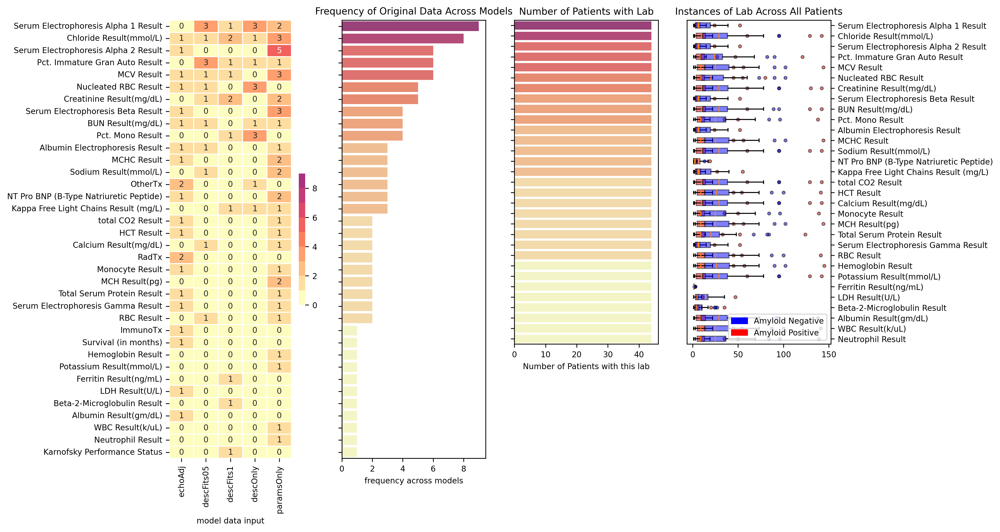

In [159]:
plt.rcParams.update({'font.size': 8})
# fig = plt.figure(figsize = (20,25))
fig = plt.figure(figsize = (12,8))

ax1 = plt.subplot2grid((4,4), (0,0), rowspan = 4)
df_binary_origdata_freq_sorted = df_orig_data_frequency_in_model.copy().reindex(sorted_features_byFreq)

# ax1 = sns.heatmap(df_orig_data_frequency_in_model, yticklabels=list(df_orig_data_frequency_in_model.index), 
#                   vmax = max_value_colormap, vmin = 0, cmap= cmap_wInsert, linewidths= 0.5, 
#                 # cbar=False
#                 cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 0.3}
#                 )

ax1 = sns.heatmap(df_binary_origdata_freq_sorted, yticklabels=list(df_binary_origdata_freq_sorted.index), 
                  vmax = max_value_colormap, vmin = 0, cmap= cmap_wInsert, linewidths= 0.5, annot = True,
                # cbar=False
                cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 0.3}
                )
ax1.set(xlabel= "model data input")

#plot frequency of the original data type across models
ax4 = plt.subplot2grid((4,4), (0,1), rowspan = 4)
#creating a colorbar for this plot to help with understanding frequency 
norm_frequency = plt.Normalize(frequency_origData_allModels["frequency across models"].min(),
                               frequency_origData_allModels["frequency across models"].max())
sm_frequency = plt.cm.ScalarMappable(cmap = cmap_woInsert, norm = norm_frequency)

#plotting frequency across models
# ax4 = sns.barplot(frequency_origData_allModels, y = "original data"  , x = "frequency across models",
#                   hue = "frequency across models", legend = False, palette = cmap_woInsert)
ax4 = sns.barplot(frequency_origData_allModels.reindex(sorted_features_byFreq), y = "original data"  , x = "frequency across models",
                  hue = "frequency across models", legend = False, palette = cmap_woInsert)
ax4.set(title = "Frequency of Original Data Across Models")
ax4.set(ylabel=None)
ax4.set(yticklabels=[])
# cbar = ax4.figure.colorbar(sm_frequency, ax = ax4, shrink = 0.3)
# cbar.set_ticks(ticks = [1, 2, 4, 6, 8, 10, 12, 14, 16])


#taking the colormaping from ax4 and maping it to the variable names so that it can be used in other plots
color_mapping = {}
for data_name in list(frequency_origData_allModels["original data"]):
    # print(data_name)
    i = int(frequency_origData_allModels.at[data_name,'frequency across models']) -1
    color_mapping[data_name] = newcolors_formap_woInsert[i]

#add another subplot that shows the completeness of data for only the labs shown
ax2 = plt.subplot2grid((4,4), (0,2), rowspan = 3)

#filter df_lab_list_numb_pts to be only the labs graphed 
new_list = []
lab_list = lab_list_import.iloc[:,0]
lab_list_import.index = lab_list_import.iloc[:,0]
# print(lab_list.values.tolist())
for item in sorted_features_byFreq:
    # print(item)
    for lab in lab_list:
        if item == lab:
            # print(item + " True")
            new_list.append(item)

masked_df_lab_numb_ptNumber = lab_list_import.loc[new_list]
# masked_df_lab_numb_ptNumber = masked_df_lab_numb_ptNumber.reindex(sorted_features_byFreq)
df_labNumb_ptNumb_filtered_subplots= masked_df_lab_numb_ptNumber.iloc[:,[0,1,2, 4,5]]

# Create a palette for the new plot based on the frequency plot
#preserves the colors assigned to a lab based on frequency
#do note that the colors were assigned by lowest value = position 0 in the colors array
#the lowest value in the frequency array is 1 not 0, keep this in mind when making a colorbar
new_palette = [color_mapping.get(data_name) for data_name in df_labNumb_ptNumb_filtered_subplots["Unnamed: 0"]]


ax2 = sns.barplot(df_labNumb_ptNumb_filtered_subplots , y = "Unnamed: 0", 
                  x = "Number of Patients with this lab",
                  palette=new_palette)

ax2.set(ylabel=None)
ax2.set(yticklabels=[])
ax2.set(title= "Number of Patients with Lab")

ax3 = plt.subplot2grid((4,4), (0,3), rowspan = 3)

dataToPlot_positive = df_NumbLabsPerLabPerPt.loc[listPositive, new_list]
dataToPlot_negative = df_NumbLabsPerLabPerPt.loc[listNegative, new_list]

# boxToPlot_allPts = [dataToPlot_positive,dataToPlot_negative]

boxplot = ax3.boxplot(dataToPlot_positive, patch_artist = True, vert=False, boxprops={"facecolor" : 'red', "alpha": 0.5},
                     flierprops = {"marker" : '.', "markersize" : 6, "markerfacecolor" :'red', "alpha": 0.5},
                     )

boxplot = ax3.boxplot(dataToPlot_negative, patch_artist = True, vert = False, boxprops={"facecolor" : 'blue', "alpha": 0.5},
                     flierprops = {"marker" : '.', "markersize" : 6, "markerfacecolor" :'blue', "alpha": 0.5},
                     )
# ax.set_xticklabels(sorted_columnNames, rotation = 'vertical', fontsize = 8 )
ax3.set_yticks(np.arange(1,len(new_list)+1, step =1), new_list, rotation = 'horizontal', fontsize = 8 )
ax3.yaxis.set_inverted(True)
ax3.yaxis.tick_right()
ax3.set_title("Instances of Lab Across All Patients")

red_patch = mpatches.Patch(color='blue', label = 'Amyloid Negative')
blue_patch = mpatches.Patch(color='red', label = 'Amyloid Positive')

ax3.legend(handles=[red_patch, blue_patch], loc = 'lower right')

fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_origFeats_comp2", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')

## 2 or 3 plots per figure

### original data and transforms by model in a line

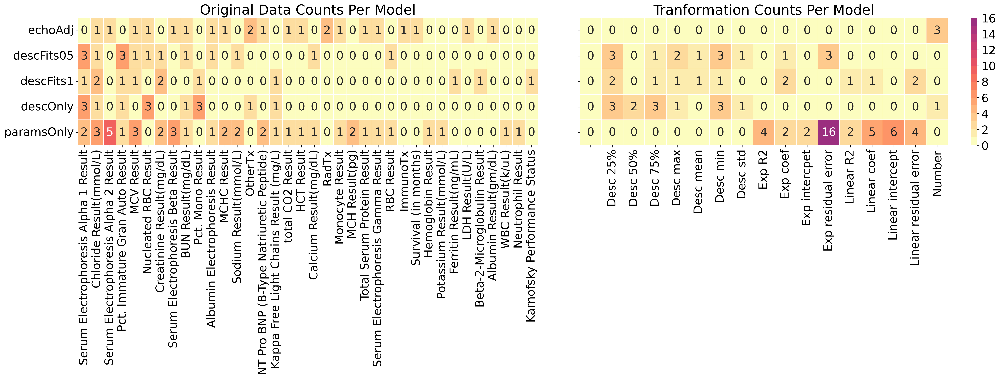

In [160]:
#original data and transforms in one line by model 
fig = plt.figure(figsize = (30,4))
plt.rcParams.update({'font.size': 20})

ax1 = plt.subplot2grid((1,4), (0,0), colspan= 2)
heatmap = sns.heatmap(df_binary_origdata_freq_sorted.T, 
                      xticklabels=list(df_binary_origdata_freq_sorted.index),
                      cmap= cmap_wInsert,  linewidths= 0.5, 
                      cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 1}, 
                      vmax = max_value_colormap, vmin = 0, cbar= False, ax =ax1, annot=True)

ax1.set_title("Original Data Counts Per Model")

ax2 = plt.subplot2grid((1,4), (0,2), colspan=2)
data_horizontal = df_transform_counts_by_model.T

heatmap_transformCounts_byModel = sns.heatmap(data_horizontal, cmap = cmap_wInsert_trans_frequency, ax = ax2, linewidths= 0.5, annot=True)
ax2.set_title("Tranformation Counts Per Model")
# ax2.set_xlabel("transformation")
ax2.set(ylabel=None)
ax2.set(yticklabels=[])

fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_orig_trans_horiz", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

plt.rcParams.update({'font.size': 8})

fig.savefig(fig_file_out, bbox_inches = 'tight')

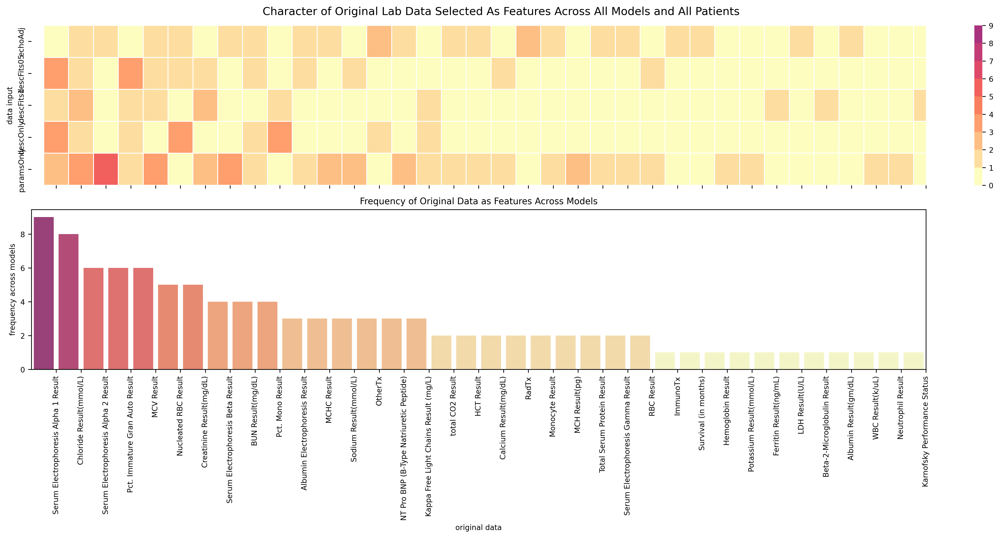

In [161]:
plt.rcParams.update({'font.size': 8})
fig, ax = plt.subplots(2,1, figsize=(15, 8), sharex = True, layout = 'constrained')
heatmap = sns.heatmap(df_binary_origdata_freq_sorted.T, 
                      xticklabels=list(df_binary_origdata_freq_sorted.index),
                      cmap= cmap_wInsert, linewidths= 0.5, 
                      cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 1}, 
                      vmax = max_value_colormap, vmin = 0, cbar= True, ax =ax[0])

# heatmap = sns.heatmap(df_binary_origdata_freq_sorted, yticklabels=list(df_binary_origdata_freq_sorted.index), 
#                   vmax = max_value_colormap, vmin = 0, cmap= cmap_wInsert, linewidths= 0.5, 
#                 # cbar=False
#                 cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 0.3}
#                 )


ax[0].set(xlabel = None)
ax[0].set(xticklabels=[])
ax[0].set(ylabel = "data input")

#plot frequency of the original data type across models

frqplot = sns.barplot(frequency_origData_allModels.reindex(sorted_features_byFreq), x = "original data"  , y = "frequency across models", 
                      ax = ax[1], hue = "frequency across models", legend = False, palette = cmap_woInsert)

ax[1].set(title = "Frequency of Original Data as Features Across Models")

ax[1].set_xticklabels(frequency_origData_allModels.reindex(sorted_features_byFreq)["original data"], rotation = 90, ha = "center")

fig.suptitle("Character of Original Lab Data Selected As Features Across All Models and All Patients", fontsize = 12)

fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_origFeat_heatmap_frq", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')

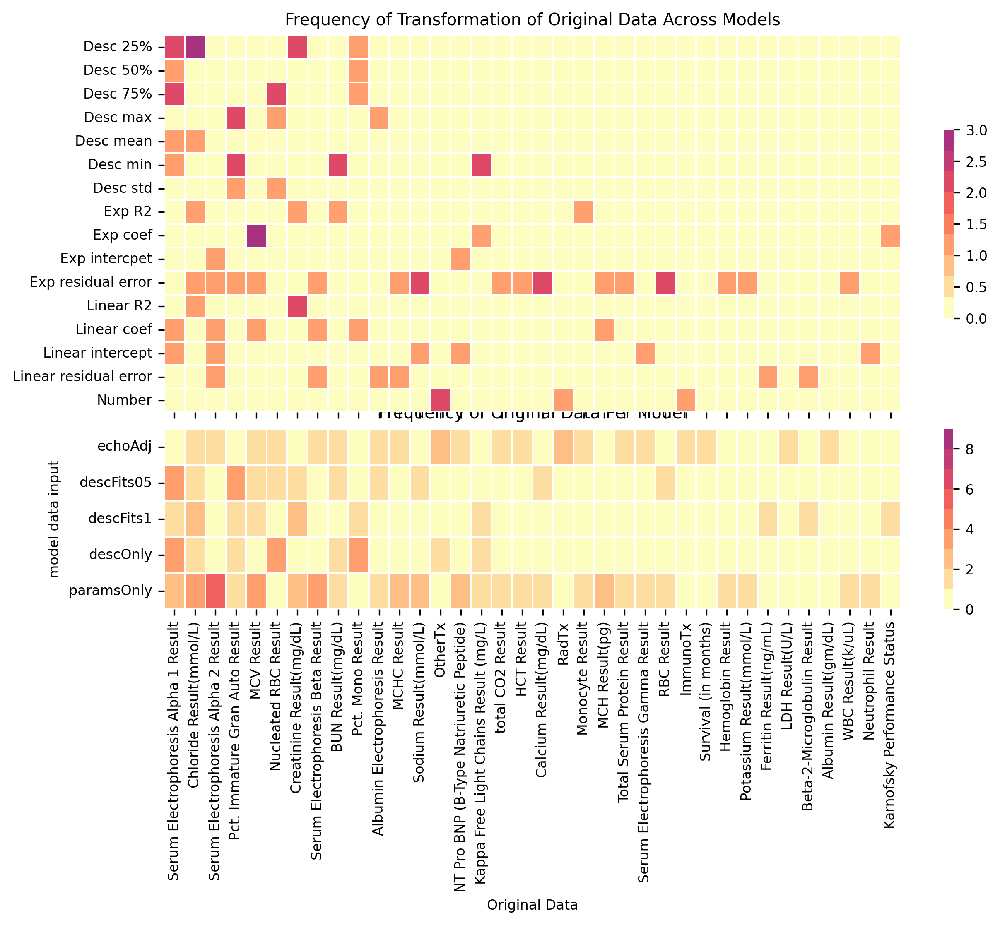

In [162]:
#visualizations
# df_transform_counts_origData.T.plot.bar(subplots= True)
plt.rcParams.update({'font.size': 8})
# fig, ax = plt.subplots(2,1, figsize=(17, 25), sharex = True, layout = 'constrained')
# fig = plt.figure(figsize = (17,15))
fig = plt.figure(figsize = (9,6))
ax0 = plt.subplot2grid((6,1), (4,0), rowspan = 2)

heatmap = sns.heatmap(df_binary_origdata_freq_sorted.T, 
                      xticklabels=list(df_binary_origdata_freq_sorted.index),
                      cmap= cmap_wInsert, linewidths= 0.5, 
                      cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 1}, 
                      vmax = max_value_colormap, vmin = 0, cbar= True, ax =ax0)

# heatmap = sns.heatmap(df_binary_origdata_freq_sorted, yticklabels=list(df_binary_origdata_freq_sorted.index), 
#                   vmax = max_value_colormap, vmin = 0, cmap= cmap_wInsert, linewidths= 0.5, 
#                 # cbar=False
#                 cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 0.3}
#                 )


ax0.set(xlabel = "Original Data")
ax0.set(ylabel = "model data input")
# ax0.set(xticklabels=[])
ax0.set_title("Frequency of Original Data Per Model")

ax1 = plt.subplot2grid((6,1), (0,0), rowspan=4)

df_transform_counts_sorted = df_transform_counts_origData.reindex(sorted_features_byFreq)

heatmap_transforms_origData = sns.heatmap(df_transform_counts_sorted.T.iloc[1:], cmap = cmap_wInsert, 
                                          linewidths= 0.5,  cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 0.5},
                                          ax = ax1)
ax1.set_title("Frequency of Transformation of Original Data Across Models")
ax1.set(xlabel = None)
ax1.set(xticklabels=[])


fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_heatmap2", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')

### 3 graph plot for large number of models

In [163]:
# plt.rcParams.update({'font.size': 8})

# fig = plt.figure(figsize = (17,14), layout = 'constrained')

# ax1_2 = plt.subplot2grid((4,1), (0,0), rowspan= 2)

# # fig, ax = plt.subplots(3,1, figsize=(17, 15), sharex = True, layout = 'constrained')
# heatmap = sns.heatmap(df_binary_origdata_freq_sorted.T, 
#                       xticklabels=list(df_binary_origdata_freq_sorted.index),
#                       cmap= cmap_wInsert, linewidths= 0.5, 
#                       cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 1}, 
#                       vmax = max_value_colormap, vmin = 0, cbar= True, ax =ax1_2)

# ax1_2.set(xlabel = None)
# ax1_2.set(ylabel = "data in- feature reduction - weighting")
# ax1_2.set(xticklabels=[])

# #plot frequency of the original data type across models
# ax2_2 = plt.subplot2grid((4,1), (2,0), rowspan= 1)
# frqplot = sns.barplot(frequency_origData_allModels.reindex(sorted_features_byFreq), x = "original data"  , y = "frequency across models", 
#                       ax = ax2_2, hue = "frequency across models", legend = False, palette = cmap_woInsert)
# ax2_2.set(title = "Frequency of Original Data as Features Across Models")
# ax2_2.set(xticklabels=[])

# ax3_2 = plt.subplot2grid((4,1), (3,0), rowspan= 1)
# ax3_2 = sns.barplot(df_labNumb_ptNumb_filtered_subplots , x = "Unnamed: 0", 
#                   y = "Number of Patients with this lab",
#                   palette=new_palette)

# ax3_2.set(ylabel= "Number of Pt with Lab")
# ax3_2.set(xlabel = "original data")
# ax3_2.set_xticklabels(frequency_origData_allModels.reindex(sorted_features_byFreq)["original data"], rotation = 90, ha = "center")
# # ax[2].set(yticklabels=[])
# ax3_2.set(title= "Number of Pt w Lab")


# fig.suptitle("Character of Original Lab Data Selected As Features Across All Models and All Patients", fontsize = 12)

# fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_comp3", 
#                                  fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

# fig.savefig(fig_file_out, bbox_inches = 'tight')

### 3 graph plot for smaller number of models

C:\Users\mcremer\AppData\Local\Temp\ipykernel_2200\4225035365.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax[2] = sns.barplot(df_labNumb_ptNumb_filtered_subplots , x = "Unnamed: 0",


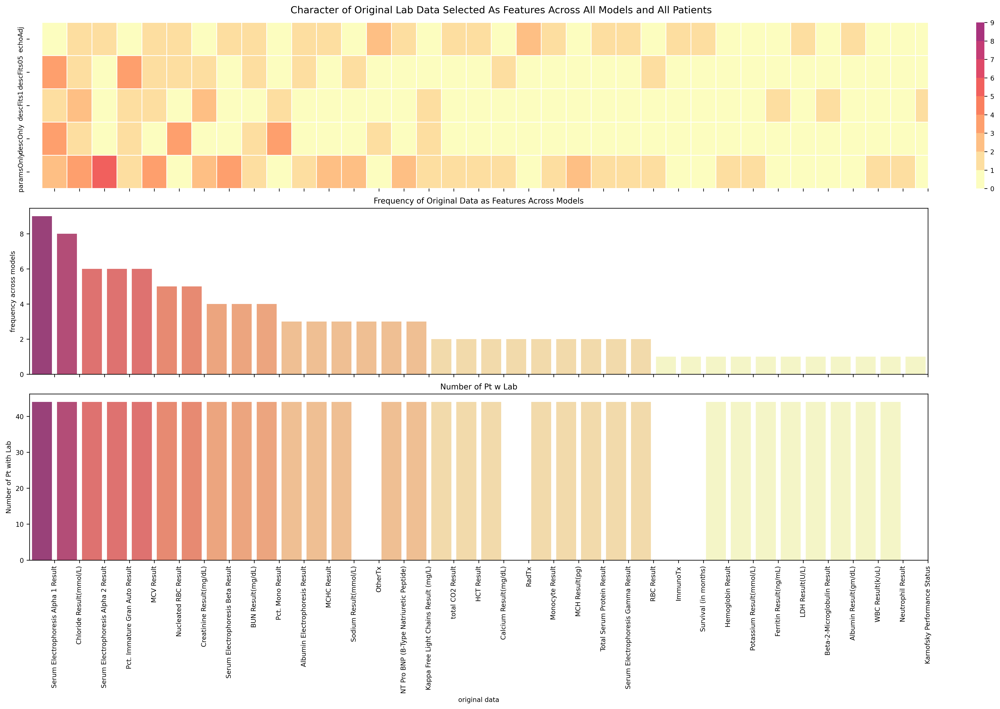

In [164]:
plt.rcParams.update({'font.size': 8})

fig, ax = plt.subplots(3,1, figsize=(17, 12), sharex = True, layout = 'constrained')
# fig, ax = plt.subplots(3,1, figsize= (15,10), sharex = True, layout = 'constrained')
heatmap = sns.heatmap(df_binary_origdata_freq_sorted.T, 
                      xticklabels=list(df_binary_origdata_freq_sorted.index),
                      cmap= cmap_wInsert, linewidths= 0.5, 
                      cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 1}, 
                      vmax = max_value_colormap, vmin = 0, cbar= True, ax =ax[0])

ax[0].set(xlabel = None)
ax[0].set(xticklabels=[])
# ax[0].set(ylabel = "data in- feature reduction - weighting")

#plot frequency of the original data type across models

frqplot = sns.barplot(frequency_origData_allModels.reindex(sorted_features_byFreq), x = "original data"  , y = "frequency across models", 
                      ax = ax[1], hue = "frequency across models", legend = False, palette = cmap_woInsert)
ax[1].set(title = "Frequency of Original Data as Features Across Models")



ax[2] = sns.barplot(df_labNumb_ptNumb_filtered_subplots , x = "Unnamed: 0", 
                  y = "Number of Patients with this lab",
                  palette=new_palette)

ax[2].set(ylabel= "Number of Pt with Lab")
ax[2].set(xlabel = "original data")
ax[2].set_xticklabels(frequency_origData_allModels.reindex(sorted_features_byFreq)["original data"], rotation = 90, ha = "center")
# ax[2].set(yticklabels=[])
ax[2].set(title= "Number of Pt w Lab")


fig.suptitle("Character of Original Lab Data Selected As Features Across All Models and All Patients", fontsize = 12)

fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_comp3", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')

C:\Users\mcremer\AppData\Local\Temp\ipykernel_2200\2382368112.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  plot_numb_pt_wLab= sns.barplot(df_labNumb_ptNumb_filtered_subplots , x = "Unnamed: 0",


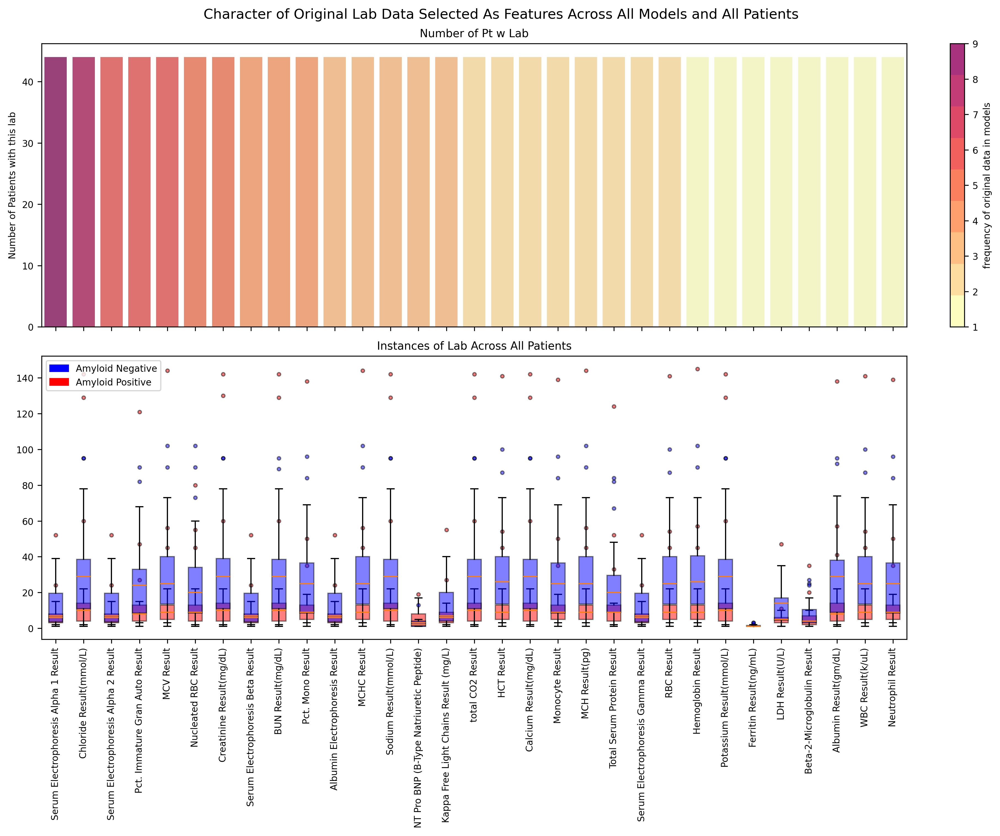

In [165]:
fig, ax = plt.subplots(2,1, figsize=(12, 10), sharex = False, layout = 'constrained')

plot_numb_pt_wLab= sns.barplot(df_labNumb_ptNumb_filtered_subplots , x = "Unnamed: 0", 
                               y = "Number of Patients with this lab", ax= ax[0],
                               palette=new_palette)

ax[0].set(xlabel=None)
ax[0].set(xticklabels=[])
ax[0].set(title= "Number of Pt w Lab")

#average instances of lab per patient
boxplot = ax[1].boxplot(dataToPlot_positive, patch_artist = True, boxprops={"facecolor" : 'red', "alpha": 0.5},
                        flierprops = {"marker" : '.', "markersize" : 6, "markerfacecolor" :'red', "alpha": 0.5})

boxplot = ax[1].boxplot(dataToPlot_negative, patch_artist = True, boxprops={"facecolor" : 'blue', "alpha": 0.5},
                     flierprops = {"marker" : '.', "markersize" : 6, "markerfacecolor" :'blue', "alpha": 0.5})
# ax[1].set_xticklabels(new_list, rotation = 'vertical', fontsize = 8 )
ax[1].set_xticks(np.arange(1,len(dataToPlot_negative.columns)+1, step =1), list(dataToPlot_negative.columns), rotation = 'vertical', fontsize = 8 )

ax[1].set_title("Instances of Lab Across All Patients")
red_patch = mpatches.Patch(color='blue', label = 'Amyloid Negative')
blue_patch = mpatches.Patch(color='red', label = 'Amyloid Positive')

ax[1].legend(handles=[red_patch, blue_patch])

fig.suptitle("Character of Original Lab Data Selected As Features Across All Models and All Patients", fontsize = 12)

cbar = ax4.figure.colorbar(sm_frequency, ax = ax[0], shrink = 1,
                           label= 'frequency of original data in models')

fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_origFeat_ptNumb_inst", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)
fig.savefig(fig_file_out, bbox_inches = 'tight')

## Illustrating data completeness for features selected by a model

copy the binary dataframe.  Then replace row column pairs which are 1 to the number of patients with that original piece of data

### box plots for average instances of data across patients

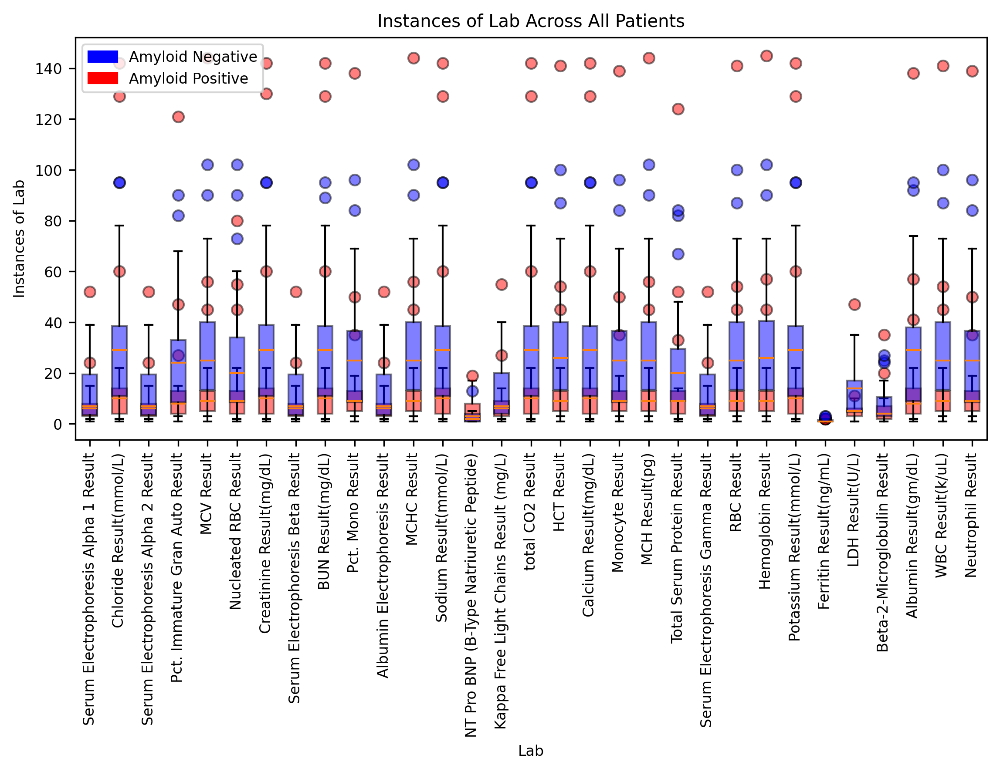

In [166]:
fig, ax = plt.subplots(figsize = (9,4))
boxplot_positive = ax.boxplot(dataToPlot_positive, patch_artist = True, boxprops={"facecolor" : 'red', "alpha": 0.5},
                        flierprops = {"marker" : 'o', "markersize" : 6, "markerfacecolor" :'red', "alpha": 0.5},
                        # showmeans= True, meanline= False , meanprops={"marker": '^', 'markerfacecolor': 'blue', "alpha": 0.5}
                        )

boxplot_negative = ax.boxplot(dataToPlot_negative, patch_artist = True, boxprops={"facecolor" : 'blue', "alpha": 0.5},
                     flierprops = {"marker" : 'o', "markersize" : 6, "markerfacecolor" :'blue', "alpha": 0.5},
                    #  showmeans= True, meanline= False , meanprops={"marker": '^', 'markerfacecolor': 'red', "alpha": 0.5}
                     )
# ax[1].set_xticklabels(new_list, rotation = 'vertical', fontsize = 8 )
ax.set_xticks(np.arange(1,len(dataToPlot_negative.columns)+1, step =1), list(dataToPlot_negative.columns), rotation = 'vertical', fontsize = 8 )
ax.set_title("Instances of Lab Across All Patients")
ax.set_xlabel("Lab")
ax.set_ylabel("Instances of Lab")

#lengend 
# import matplotlib.patches as mpatches

red_patch = mpatches.Patch(color='blue', label = 'Amyloid Negative')
blue_patch = mpatches.Patch(color='red', label = 'Amyloid Positive')

ax.legend(handles=[red_patch, blue_patch])

fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_origFeats_box", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')

### number of patients with the lab

C:\Users\mcremer\AppData\Local\Temp\ipykernel_2200\4223630080.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  plot_numb_pt_wLab= sns.barplot(df_labNumb_ptNumb_filtered_subplots , x = "Unnamed: 0",
C:\Users\mcremer\AppData\Local\Temp\ipykernel_2200\4223630080.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(frequency_origData_allModels["original data"], rotation = 90, ha = "center")


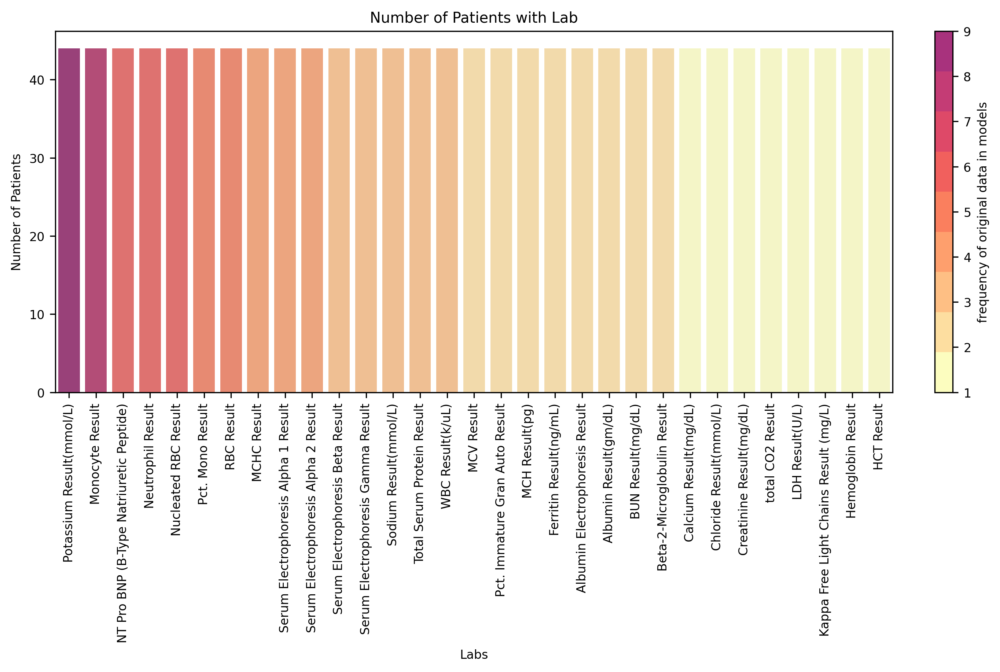

In [167]:
fig, ax = plt.subplots(figsize=(9, 6), layout = 'constrained')

plot_numb_pt_wLab= sns.barplot(df_labNumb_ptNumb_filtered_subplots , x = "Unnamed: 0", 
                               y = "Number of Patients with this lab",
                               palette=new_palette)

ax.set(xlabel= 'Labs')
ax.set_xticklabels(frequency_origData_allModels["original data"], rotation = 90, ha = "center")
ax.set_ylabel("Number of Patients")
ax.set(title= "Number of Patients with Lab")

cbar = ax4.figure.colorbar(sm_frequency, ax = ax, shrink = 1,
                           label= 'frequency of original data in models')

fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_numbPtWLab", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')

### heatmap of features across models

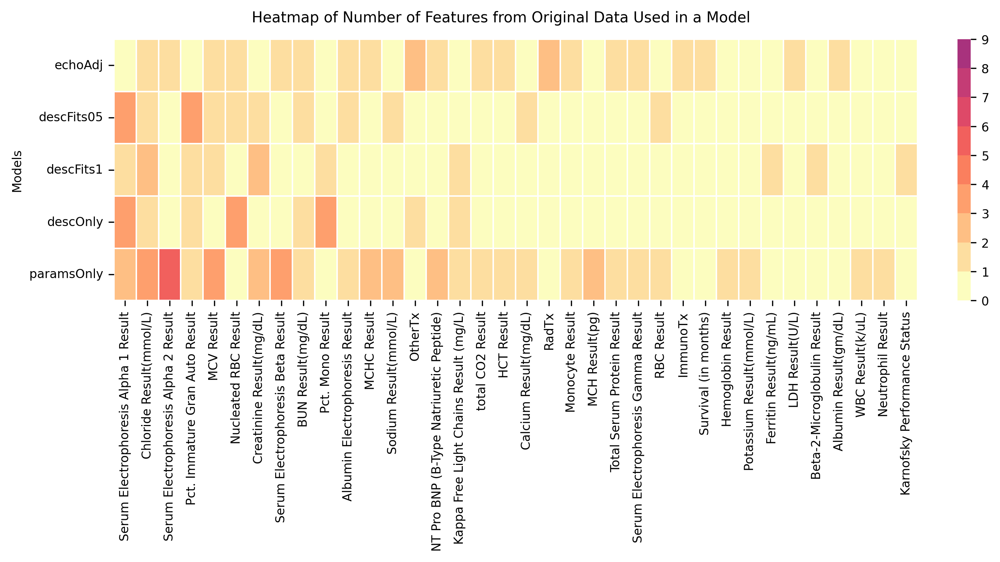

In [168]:
# plt.rcParams.update({'font.size': 8})
fig, ax = plt.subplots(figsize=(9, 5), layout = 'constrained')
heatmap = sns.heatmap(df_binary_origdata_freq_sorted.T, 
                      xticklabels=list(df_binary_origdata_freq_sorted.index),
                      yticklabels= list(df_binary_origdata_freq_sorted.columns),
                      cmap= cmap_wInsert, linewidths= 0.5, 
                      cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 1}, 
                      vmax = max_value_colormap, vmin = 0, cbar= True)

ax.set_xticklabels(frequency_origData_allModels.reindex(sorted_features_byFreq)["original data"], rotation = 90, ha = "center")
ax.set_ylabel("Models")
ax.set_yticklabels( df_binary_origdata_freq_sorted.columns, rotation = 0)
fig.suptitle("Heatmap of Number of Features from Original Data Used in a Model")


fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_heatmap", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')



### frequency of the lab among models

C:\Users\mcremer\AppData\Local\Temp\ipykernel_2200\1107452822.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(frequency_origData_allModels["original data"], rotation = 90, ha = "center")


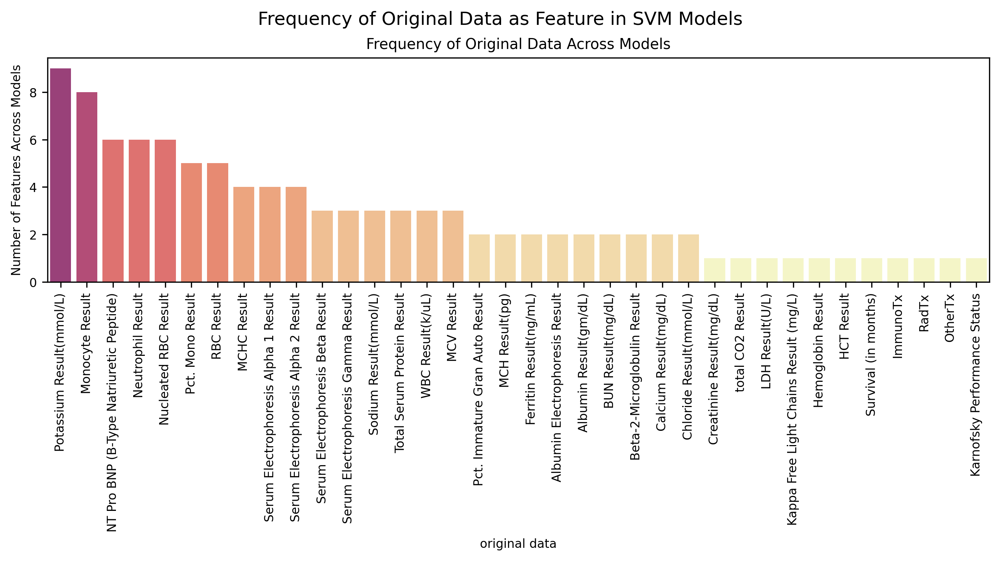

In [169]:
#plot frequency of the original data type across models
fig, ax = plt.subplots(figsize=(9, 5), layout = 'constrained')
frqplot = sns.barplot(frequency_origData_allModels.reindex(sorted_features_byFreq), x = "original data"  , y = "frequency across models", 
                      hue = "frequency across models", legend = False, palette = cmap_woInsert)
ax.set(title = "Frequency of Original Data Across Models")
ax.set_xticklabels(frequency_origData_allModels["original data"], rotation = 90, ha = "center")
ax.set_ylabel("Number of Features Across Models")

fig.suptitle("Frequency of Original Data as Feature in SVM Models", fontsize = 12)

fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_origFreq", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')

# Visualizations sorted by number of pts with lab

C:\Users\mcremer\AppData\Local\Temp\ipykernel_2200\4064221932.py:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax2 = sns.barplot(df_labNumb_ptNumb_filtered_subplots , y = "Unnamed: 0",


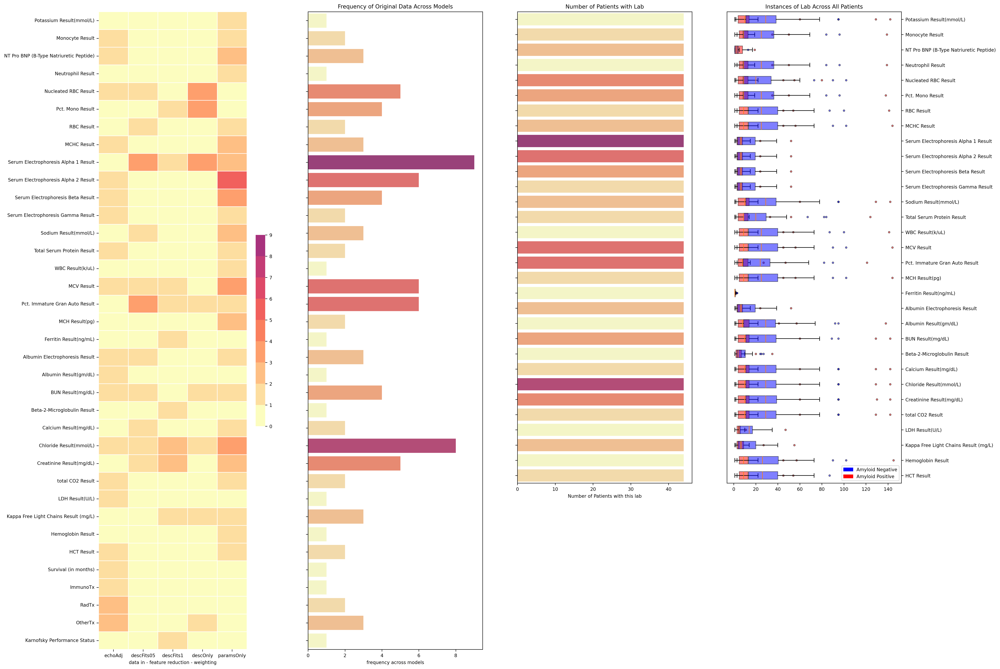

In [170]:
plt.rcParams.update({'font.size': 8})
fig = plt.figure(figsize = (25,20))

ax1 = plt.subplot2grid((4,4), (0,0), rowspan = 4)
df_binary_origdata_freq_sorted = df_orig_data_frequency_in_model.copy().reindex(sorted_features_byFreq)

# ax1 = sns.heatmap(df_orig_data_frequency_in_model, yticklabels=list(df_orig_data_frequency_in_model.index), 
#                   vmax = max_value_colormap, vmin = 0, cmap= cmap_wInsert, linewidths= 0.5, 
#                 # cbar=False
#                 cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 0.3}
#                 )

ax1 = sns.heatmap(df_orig_data_frequency_in_model, yticklabels=list(df_orig_data_frequency_in_model.index), 
                  vmax = max_value_colormap, vmin = 0, cmap= cmap_wInsert, linewidths= 0.5, 
                # cbar=False
                cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 0.3}
                )
ax1.set_xlabel("data in - feature reduction - weighting")


#plot frequency of the original data type across models
ax4 = plt.subplot2grid((4,4), (0,1), rowspan = 4)
#creating a colorbar for this plot to help with understanding frequency 
norm_frequency = plt.Normalize(frequency_origData_allModels["frequency across models"].min(),
                               frequency_origData_allModels["frequency across models"].max())
sm_frequency = plt.cm.ScalarMappable(cmap = cmap_woInsert, norm = norm_frequency)

#plotting frequency across models
# ax4 = sns.barplot(frequency_origData_allModels, y = "original data"  , x = "frequency across models",
#                   hue = "frequency across models", legend = False, palette = cmap_woInsert)
ax4 = sns.barplot(frequency_origData_allModels, y = "original data"  , x = "frequency across models",
                  hue = "frequency across models", legend = False, palette = cmap_woInsert)
ax4.set(title = "Frequency of Original Data Across Models")
ax4.set(ylabel=None)
ax4.set(yticklabels=[])
# cbar = ax4.figure.colorbar(sm_frequency, ax = ax4, shrink = 0.3)
# cbar.set_ticks(ticks = [1, 2, 4, 6, 8, 10, 12, 14, 16])


#taking the colormaping from ax4 and maping it to the variable names so that it can be used in other plots
color_mapping = {}
for data_name in list(frequency_origData_allModels["original data"]):
    # print(data_name)
    i = int(frequency_origData_allModels.at[data_name,'frequency across models']) -1
    color_mapping[data_name] = newcolors_formap_woInsert[i]

#add another subplot that shows the completeness of data for only the labs shown
ax2 = plt.subplot2grid((4,4), (0,2), rowspan = 3)

#filter df_lab_list_numb_pts to be only the labs graphed 
new_list = []
lab_list = lab_list_import.iloc[:,0]
lab_list_import.index = lab_list_import.iloc[:,0]
# print(lab_list.values.tolist())
for item in list(dict_og_to_trimmed_transformed.keys()):
    # print(item)
    for lab in lab_list:
        if item == lab:
            # print(item + " True")
            new_list.append(item)

masked_df_lab_numb_ptNumber = lab_list_import.loc[new_list]
# masked_df_lab_numb_ptNumber = masked_df_lab_numb_ptNumber.reindex(sorted_features_byFreq)
df_labNumb_ptNumb_filtered_subplots= masked_df_lab_numb_ptNumber.iloc[:,[0,1,2, 4,5]]

# Create a palette for the new plot based on the frequency plot
#preserves the colors assigned to a lab based on frequency
#do note that the colors were assigned by lowest value = position 0 in the colors array
#the lowest value in the frequency array is 1 not 0, keep this in mind when making a colorbar
new_palette = [color_mapping.get(data_name) for data_name in df_labNumb_ptNumb_filtered_subplots["Unnamed: 0"]]


ax2 = sns.barplot(df_labNumb_ptNumb_filtered_subplots , y = "Unnamed: 0", 
                  x = "Number of Patients with this lab",
                  palette=new_palette)

ax2.set(ylabel=None)
ax2.set(yticklabels=[])
ax2.set(title= "Number of Patients with Lab")

ax3 = plt.subplot2grid((4,4), (0,3), rowspan = 3)

dataToPlot_positive = df_NumbLabsPerLabPerPt.loc[listPositive, new_list]
dataToPlot_negative = df_NumbLabsPerLabPerPt.loc[listNegative, new_list]

# boxToPlot_allPts = [dataToPlot_positive,dataToPlot_negative]

boxplot = ax3.boxplot(dataToPlot_positive, patch_artist = True, vert=False, boxprops={"facecolor" : 'red', "alpha": 0.5},
                     flierprops = {"marker" : '.', "markersize" : 6, "markerfacecolor" :'red', "alpha": 0.5},
                     )

boxplot = ax3.boxplot(dataToPlot_negative, patch_artist = True, vert = False, boxprops={"facecolor" : 'blue', "alpha": 0.5},
                     flierprops = {"marker" : '.', "markersize" : 6, "markerfacecolor" :'blue', "alpha": 0.5},
                     )
# ax.set_xticklabels(sorted_columnNames, rotation = 'vertical', fontsize = 8 )
ax3.set_yticks(np.arange(1,len(new_list)+1, step =1), new_list, rotation = 'horizontal', fontsize = 8 )
ax3.yaxis.set_inverted(True)
ax3.yaxis.tick_right()
ax3.set_title("Instances of Lab Across All Patients")

red_patch = mpatches.Patch(color='blue', label = 'Amyloid Negative')
blue_patch = mpatches.Patch(color='red', label = 'Amyloid Positive')

ax3.legend(handles=[red_patch, blue_patch], loc = 'lower right')

fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_origFeats_comp_unsort", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')

## individual plots

### box plots

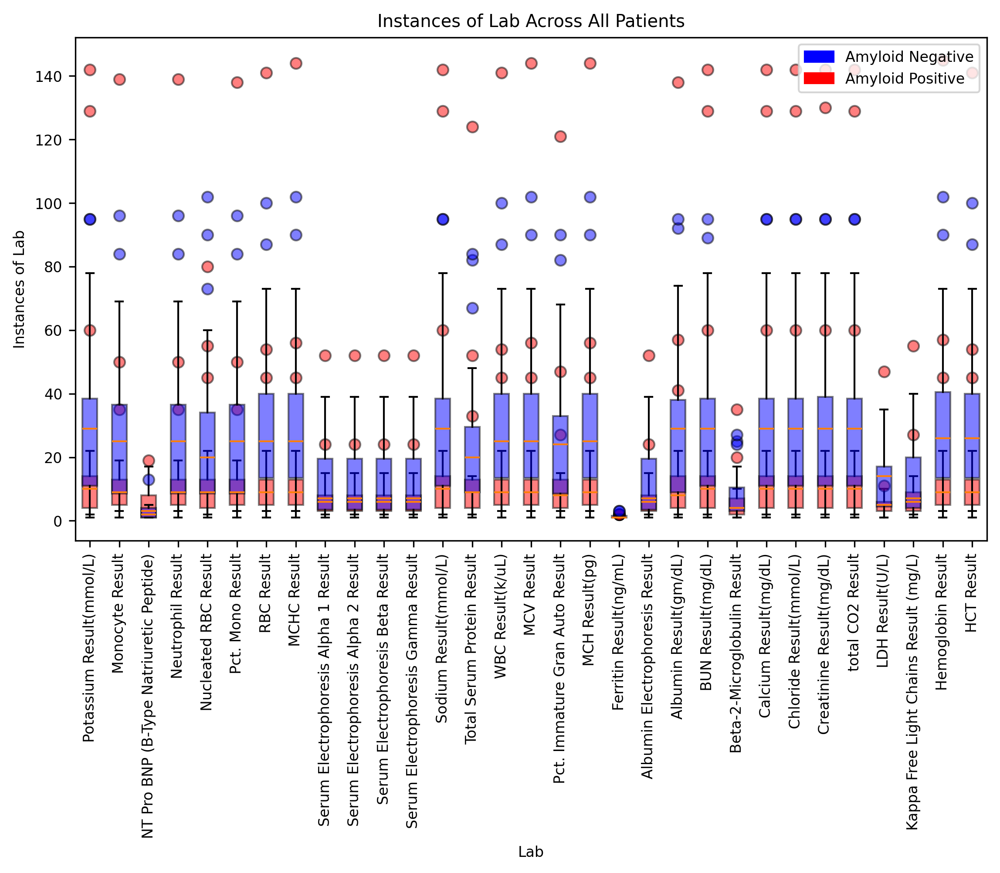

In [171]:
fig, ax = plt.subplots(figsize = (9,5))
boxplot_positive = ax.boxplot(dataToPlot_positive, patch_artist = True, boxprops={"facecolor" : 'red', "alpha": 0.5},
                        flierprops = {"marker" : 'o', "markersize" : 6, "markerfacecolor" :'red', "alpha": 0.5},
                        # showmeans= True, meanline= False , meanprops={"marker": '^', 'markerfacecolor': 'blue', "alpha": 0.5}
                        )

boxplot_negative = ax.boxplot(dataToPlot_negative, patch_artist = True, boxprops={"facecolor" : 'blue', "alpha": 0.5},
                     flierprops = {"marker" : 'o', "markersize" : 6, "markerfacecolor" :'blue', "alpha": 0.5},
                    #  showmeans= True, meanline= False , meanprops={"marker": '^', 'markerfacecolor': 'red', "alpha": 0.5}
                     )
# ax[1].set_xticklabels(new_list, rotation = 'vertical', fontsize = 8 )
ax.set_xticks(np.arange(1,len(dataToPlot_negative.columns)+1, step =1), list(dataToPlot_negative.columns), rotation = 'vertical', fontsize = 8 )
ax.set_title("Instances of Lab Across All Patients")
ax.set_xlabel("Lab")
ax.set_ylabel("Instances of Lab")

#lengend 
# import matplotlib.patches as mpatches

red_patch = mpatches.Patch(color='blue', label = 'Amyloid Negative')
blue_patch = mpatches.Patch(color='red', label = 'Amyloid Positive')

ax.legend(handles=[red_patch, blue_patch])

fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_origFeats_box_unsort", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')

### numb pt w lab

C:\Users\mcremer\AppData\Local\Temp\ipykernel_2200\1107940924.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  plot_numb_pt_wLab= sns.barplot(df_labNumb_ptNumb_filtered_subplots , x = "Unnamed: 0",
C:\Users\mcremer\AppData\Local\Temp\ipykernel_2200\1107940924.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(frequency_origData_allModels["original data"], rotation = 90, ha = "center")


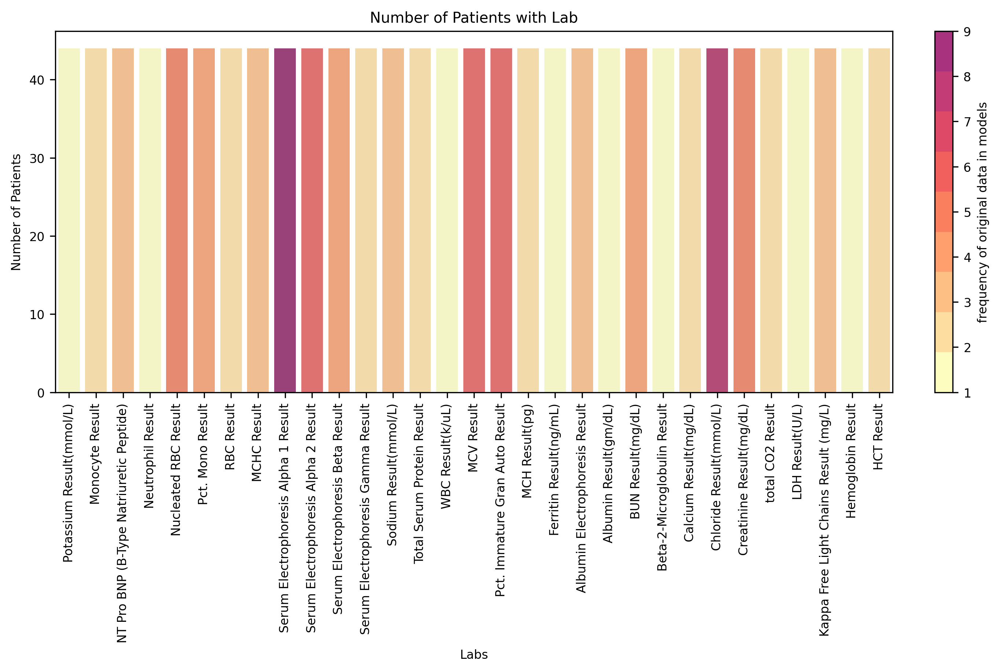

In [172]:
fig, ax = plt.subplots(figsize=(9, 6), layout = 'constrained')

plot_numb_pt_wLab= sns.barplot(df_labNumb_ptNumb_filtered_subplots , x = "Unnamed: 0", 
                               y = "Number of Patients with this lab",
                               palette=new_palette)

ax.set(xlabel= 'Labs')
ax.set_xticklabels(frequency_origData_allModels["original data"], rotation = 90, ha = "center")
ax.set_ylabel("Number of Patients")
ax.set(title= "Number of Patients with Lab")

cbar = ax4.figure.colorbar(sm_frequency, ax = ax, shrink = 1,
                           label= 'frequency of original data in models')

fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_numbPtWLab_unsort", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')

### heat map 


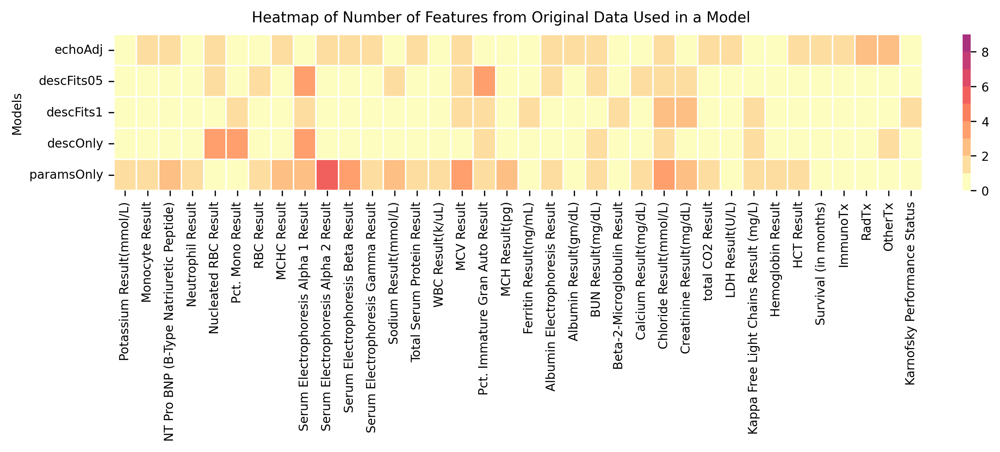

In [173]:
# plt.rcParams.update({'font.size': 8})
fig, ax = plt.subplots(figsize=(9, 4), layout = 'constrained')
heatmap = sns.heatmap(df_orig_data_frequency_in_model.T, 
                      xticklabels=list(df_orig_data_frequency_in_model.index),
                      cmap= cmap_wInsert, linewidths= 0.5, 
                      cbar_kws={'location': 'right', 'fraction': 0.1, 'shrink': 1}, 
                      vmax = max_value_colormap, vmin = 0, cbar= True)

ax.set_xticklabels(frequency_origData_allModels["original data"], rotation = 90, ha = "center")
ax.set_yticklabels(df_orig_data_frequency_in_model.columns, rotation = 0)
ax.set_ylabel("Models")
fig.suptitle("Heatmap of Number of Features from Original Data Used in a Model")


fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_heatmap_unsorted", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')



### frequency of labs 

C:\Users\mcremer\AppData\Local\Temp\ipykernel_2200\1537827617.py:6: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(frequency_origData_allModels["original data"], rotation = 90, ha = "center")


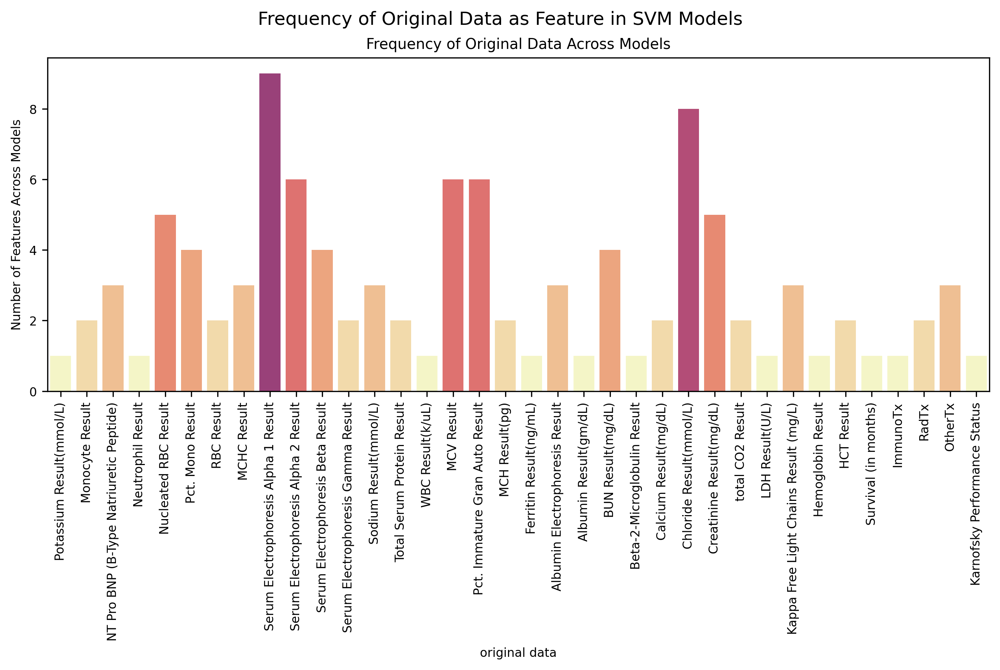

In [174]:
#plot frequency of the original data type across models
fig, ax = plt.subplots(figsize=(9, 6), layout = 'constrained')
frqplot = sns.barplot(frequency_origData_allModels, x = "original data"  , y = "frequency across models", 
                      hue = "frequency across models", legend = False, palette = cmap_woInsert)
ax.set(title = "Frequency of Original Data Across Models")
ax.set_xticklabels(frequency_origData_allModels["original data"], rotation = 90, ha = "center")
ax.set_ylabel("Number of Features Across Models")

fig.suptitle("Frequency of Original Data as Feature in SVM Models", fontsize = 12)

fig_file_out = outputFiguresPath(fileName_header=fileNameHeader, fileName_mid="_allModels_origFreq_unsorted", 
                                 fileName_suff= fileNameSuffix, parent_dir=parent_dir, folderName=folder_data_out)

fig.savefig(fig_file_out, bbox_inches = 'tight')